# Palantir Part 1

In [1]:
 # source ~/venv-jlab/bin/activate

using: https://palantir.readthedocs.io/en/latest/notebooks/Palantir_sample_notebook.html

In [2]:
import palantir
import scanpy as sc
import pandas as pd
import os

# Plotting
import matplotlib
import matplotlib.pyplot as plt

# warnings
import warnings
from numba.core.errors import NumbaDeprecationWarning

warnings.filterwarnings(action="ignore", category=NumbaDeprecationWarning)
warnings.filterwarnings(
    action="ignore", module="scanpy", message="No data for colormapping"
)

# Inline plotting
%matplotlib inline

In [297]:
#atlas_full = sc.read('./atlas.h5ad') (I mistakenly overwrite it in the end, if you need it got the 'Prepfor_pseudotime....' and reproduce it)
#atlas_full

In [4]:
# Define the list of cell types you want to keep
keep_cts = [
    "Cardiomyocytes FHF 1",
    "Cardiomyocytes FHF 2",
    "Cardiomyocytes SHF 1",
    "Cardiomyocytes SHF 2",
    "Cardiopharyngeal progenitors",
    "Cardiopharyngeal progenitors FHF",
    "Cardiopharyngeal progenitors SHF",
    "Endocardium",
    "Epicardium",
    "Pharyngeal mesoderm",
    "Epiblast",
    "Primitive Streak",
    "Allantois",
    "Allantois endothelium",
    "Blood progenitors",
    "Chorioallantoic-derived erythroid progenitors",
    "Embryo proper endothelium",
    "EMP",
    "Erythroid",
    "Haematoendothelial progenitors",
    "Megakaryocyte progenitors",
    "MEP",
    "Venous endothelium",
    "YS endothelium",
    "YS mesothelium-derived endothelial progenitors",
    "Lateral plate mesoderm",
    "Limb mesoderm",
    "Mesenchyme",
    "Nascent mesoderm",
    "Embryo proper mesothelium",
    "YS mesothelium"
]

# Subset the AnnData object
atlas = atlas_full[atlas_full.obs['celltype_extended_atlas'].isin(keep_cts)].copy()

# (Optional) Check how many cells of each type you have
print(atlas.obs['celltype_extended_atlas'].value_counts())


celltype_extended_atlas
Erythroid                                         38975
Epiblast                                          13151
Mesenchyme                                        12201
Lateral plate mesoderm                            11484
Limb mesoderm                                     10014
Allantois                                          8522
Primitive Streak                                   8128
YS mesothelium                                     6697
Venous endothelium                                 6038
Nascent mesoderm                                   5422
Cardiopharyngeal progenitors SHF                   5151
Embryo proper mesothelium                          3856
Embryo proper endothelium                          3475
Pharyngeal mesoderm                                3361
YS endothelium                                     3125
Cardiopharyngeal progenitors FHF                   3074
Epicardium                                         3042
Blood progenitors       

In [5]:
atlas

AnnData object with n_obs × n_vars = 170950 × 27669
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'cell', 'sample', 'embryo_version', 'stage', 'somite_count', 'anatomy', 'S_score', 'G2M_score', 'phase', 'louvain', 'leiden', 'celltype_PijuanSala2019', 'celltype_extended_atlas', 'sizeFactor'
    var: 'id', 'mgi_symbol', 'symbol'
    obsm: 'X_PCA', 'X_UMAP'

In [6]:
atlas.obsm['X_umap'] = atlas.obsm['X_UMAP']

In [7]:
atlas.obsm['X_pca'] = atlas.obsm['X_PCA']

In [8]:
atlas

AnnData object with n_obs × n_vars = 170950 × 27669
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'cell', 'sample', 'embryo_version', 'stage', 'somite_count', 'anatomy', 'S_score', 'G2M_score', 'phase', 'louvain', 'leiden', 'celltype_PijuanSala2019', 'celltype_extended_atlas', 'sizeFactor'
    var: 'id', 'mgi_symbol', 'symbol'
    obsm: 'X_PCA', 'X_UMAP', 'X_umap', 'X_pca'

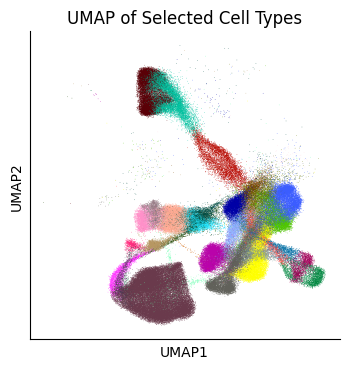

In [9]:
sc.pl.umap(
    atlas,
    color='celltype_extended_atlas',
    legend_loc=None,
    title='UMAP of Selected Cell Types'
)

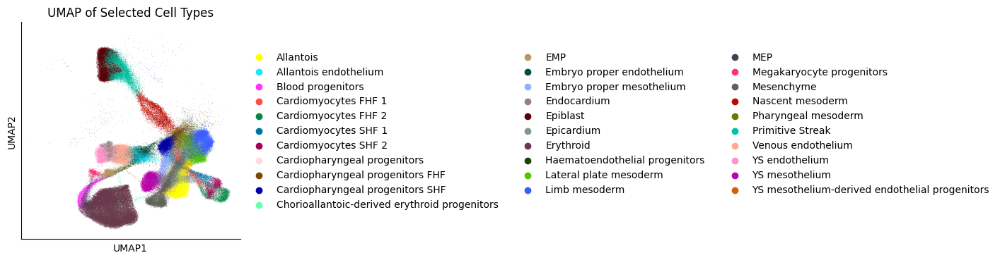

In [10]:
sc.pl.umap(
    atlas,
    color='celltype_extended_atlas',
    legend_loc='right margin',
    title='UMAP of Selected Cell Types'
)


# Run diffusion maps

In [166]:
# Run diffusion maps
dm_res = palantir.utils.run_diffusion_maps(atlas, n_components = 50)

In [167]:
ms_data = palantir.utils.determine_multiscale_space(atlas)

In [169]:
imputed_X = palantir.utils.run_magic_imputation(atlas,n_jobs=12,)

In [170]:
atlas

AnnData object with n_obs × n_vars = 170950 × 27669
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'cell', 'sample', 'embryo_version', 'stage', 'somite_count', 'anatomy', 'S_score', 'G2M_score', 'phase', 'louvain', 'leiden', 'celltype_PijuanSala2019', 'celltype_extended_atlas', 'sizeFactor', 'palantir_pseudotime', 'palantir_entropy'
    var: 'id', 'mgi_symbol', 'symbol'
    uns: 'celltype_extended_atlas_colors', 'DM_EigenValues', 'palantir_waypoints', 'palantir_fates_colors'
    obsm: 'X_PCA', 'X_UMAP', 'X_umap', 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'gene_trends_Allantois', 'gene_trends_YS Endothelium', 'gene_trends_Erythroid', 'gene_trends_MkP', 'gene_trends_Mesenchyme', 'gene_trends_Cardiomyocytes', 'gene_trends_Limb Mesoderm', 'gene_trends_YS Mesothelium', 'gene_trends_LP Mesoderm', 'gene_trends_EMP', 'gene_trends_Endocardium', 'gene_trends_Epicardium'
    layers: 'MAGIC_imputed_data'

In [171]:
atlas.layers['MAGIC_imputed_data']

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 1942397920 stored elements and shape (170950, 27669)>

In [172]:
imputed_X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 1942397920 stored elements and shape (170950, 27669)>

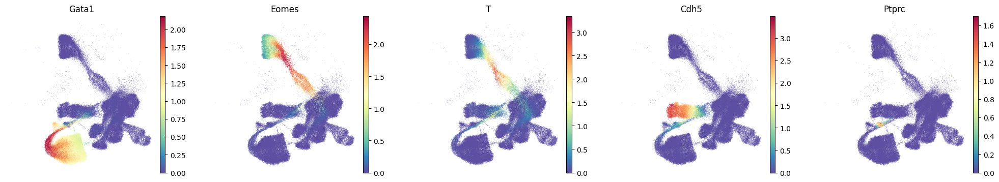

In [173]:
sc.pl.embedding(
    atlas,
    basis="X_UMAP",
    layer="MAGIC_imputed_data",
    color=["Gata1", "Eomes", "T", "Cdh5", "Ptprc"],
    frameon=False,
    ncols=5
)
plt.show()

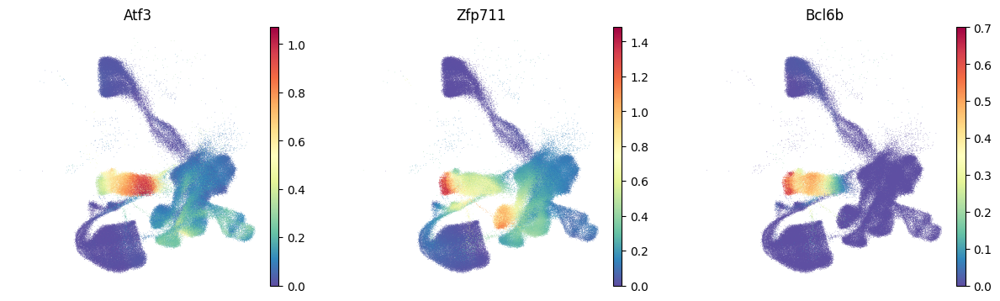

In [174]:
sc.pl.embedding(
    atlas,
    basis="X_UMAP",
    layer="MAGIC_imputed_data",
    color=["Atf3", "Zfp711", "Bcl6b"],
    frameon=False,
)
plt.show()

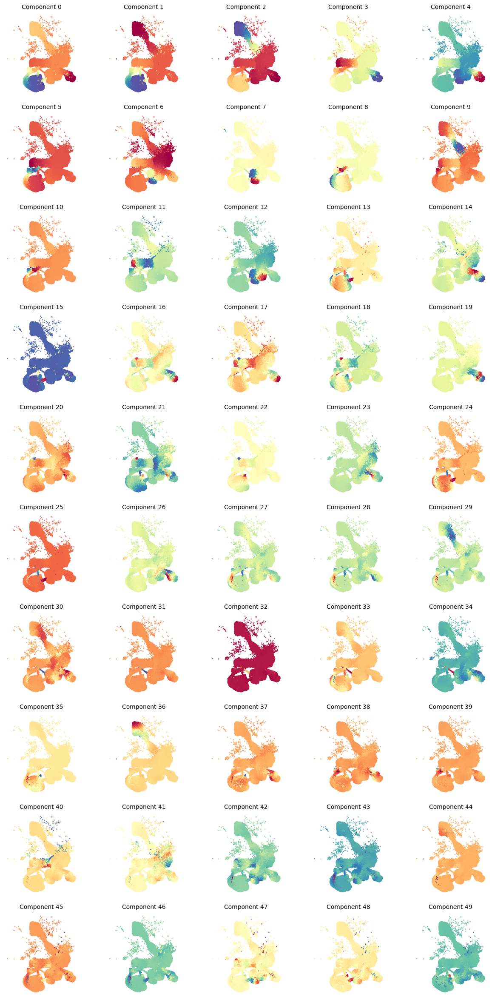

In [175]:
palantir.plot.plot_diffusion_components(atlas)
plt.show()

In [176]:
terminal_states_atlas = pd.Series(
    [
        "EMP",
        "MkP",
        "Erythroid",
        "YS Endothelium",
        "Endocardium",
        "YS Mesothelium",
        "Mesenchyme",
        "Allantois",
        "Epicardium",
        "Cardiomyocytes",
        "Limb Mesoderm",
        "LP Mesoderm"
    ],
    [
        'ext_cell_328761',  # EMP
        'ext_cell_329685',  # MkP
        'ext_cell_189604',  # Erythroid
        'ext_cell_14984',   # YS Endothelium
        'ext_cell_343138',  # Endocardium
        'ext_cell_241307',  # YS Mesothelium
        'ext_cell_325578',  # Mesenchyme
        'ext_cell_194268',  # Allantois
        'ext_cell_7917',    # Epicardium
        'ext_cell_172850',  # Cardiomyocytes
        'ext_cell_318387',  # Limb Mesoderm
        'ext_cell_29525'   # LP Mesoderm
    ]
)

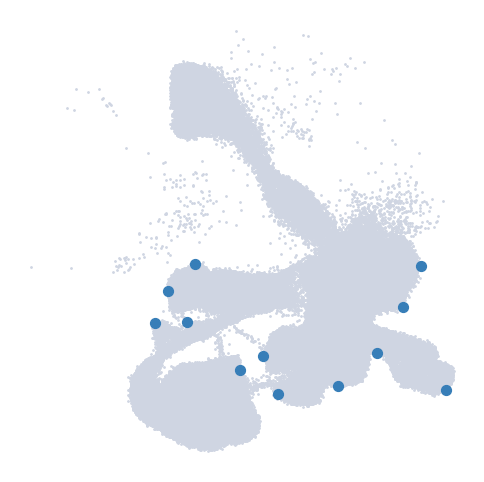

In [177]:
palantir.plot.highlight_cells_on_umap(
    atlas,
    list(terminal_states_atlas.index),  # <-- just the cell IDs
    s=1,                # background dot size
    s_highlighted=50,   # highlighted dot size
    figsize=(6, 6)
)
plt.show()


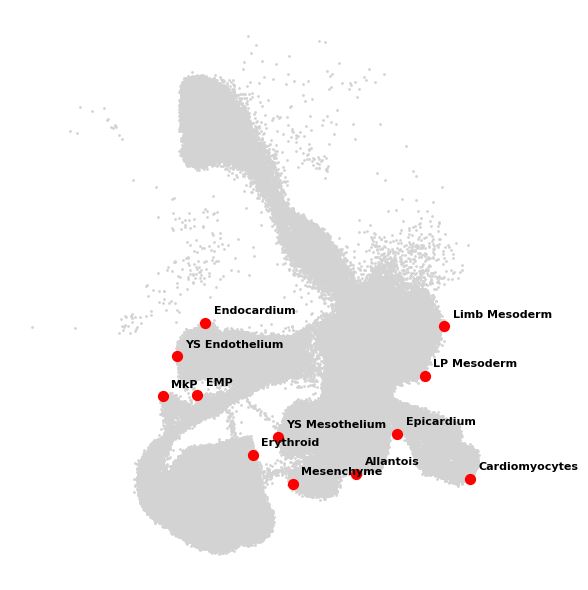

In [178]:
import matplotlib.pyplot as plt
import pandas as pd

# 1. pull out your UMAP coords as a DataFrame
umap_df = (
    pd.DataFrame(
        atlas.obsm['X_umap'],
        index=atlas.obs_names,
        columns=['x','y']
    )
)

fig, ax = plt.subplots(figsize=(6, 6))

# 2. plot all cells in light gray
ax.scatter(
    umap_df['x'], umap_df['y'],
    s=1, color='lightgray'
)

# 3. overlay each terminal‐state cell in red + add its label
for cell, label in terminal_states_atlas.items():
    if cell not in umap_df.index:
        continue
    x, y = umap_df.loc[cell, ['x','y']]
    ax.scatter(x, y, s=50, color='red')
    ax.text(
        x + 0.5, y + 0.5,        # small offset in data‐units
        label,
        fontsize=8,
        weight='bold'
    )

ax.set_axis_off()
plt.tight_layout()
plt.show()


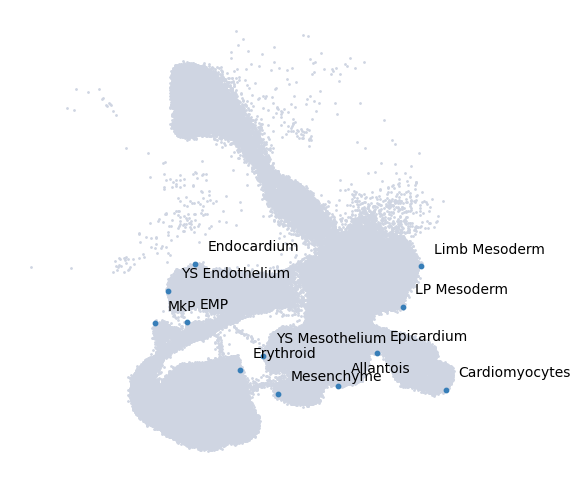

In [179]:
palantir.plot.highlight_cells_on_umap(atlas, terminal_states_atlas)
plt.show()

In [180]:
start_cell = "cell_5856"
pr_res = palantir.core.run_palantir(
    atlas, start_cell,  terminal_states=terminal_states_atlas
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.14890584150950115 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 2.4749332149823506 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9995
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [181]:
terminal_states_atlas

ext_cell_328761               EMP
ext_cell_329685               MkP
ext_cell_189604         Erythroid
ext_cell_14984     YS Endothelium
ext_cell_343138       Endocardium
ext_cell_241307    YS Mesothelium
ext_cell_325578        Mesenchyme
ext_cell_194268         Allantois
ext_cell_7917          Epicardium
ext_cell_172850    Cardiomyocytes
ext_cell_318387     Limb Mesoderm
ext_cell_29525        LP Mesoderm
dtype: object

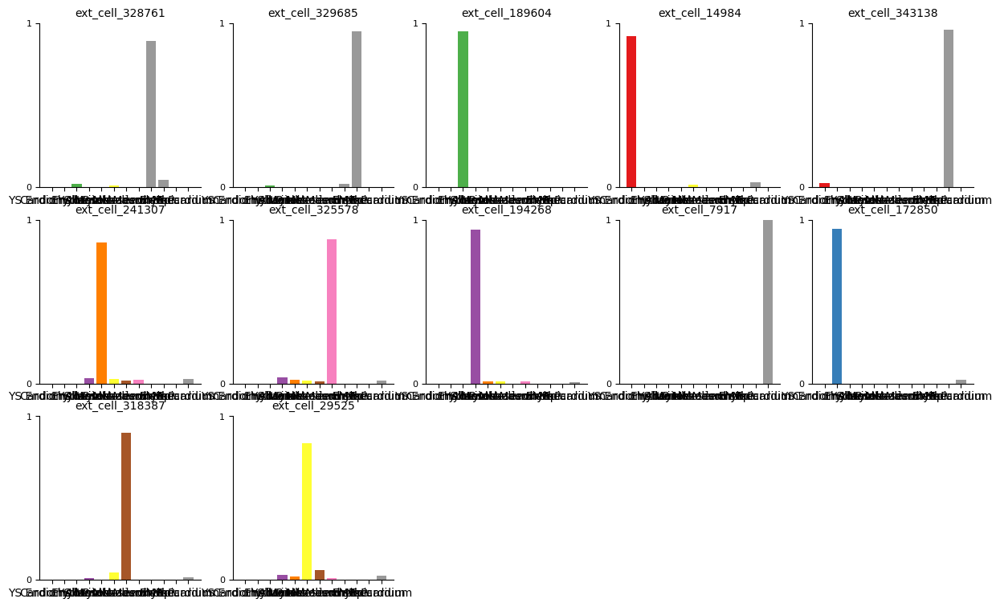

In [182]:
cells_atlas_end =    [
        'ext_cell_328761',  # EMP
        'ext_cell_329685',  # MkP
        'ext_cell_189604',  # Erythroid
        'ext_cell_14984',   # YS Endothelium
        'ext_cell_343138',  # Endocardium
        'ext_cell_241307',  # YS Mesothelium
        'ext_cell_325578',  # Mesenchyme
        'ext_cell_194268',  # Allantois
        'ext_cell_7917',    # Epicardium
        'ext_cell_172850',  # Cardiomyocytes
        'ext_cell_318387',  # Limb Mesoderm
        'ext_cell_29525'   # LP Mesoderm
    ]
palantir.plot.plot_terminal_state_probs(atlas, cells_atlas_end)
plt.show()

In [185]:
masks_atlas = palantir.presults.select_branch_cells(atlas, q=.01, eps=.01)

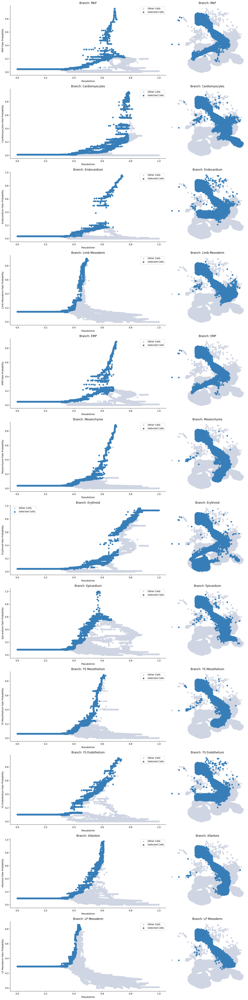

In [186]:
palantir.plot.plot_branch_selection(atlas)
plt.show()

[2025-07-17 13:07:50,882] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (31,494) and rank = 1.0.
[2025-07-17 13:07:50,882] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:07:50,883] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:07:51,138] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: EMP'}>

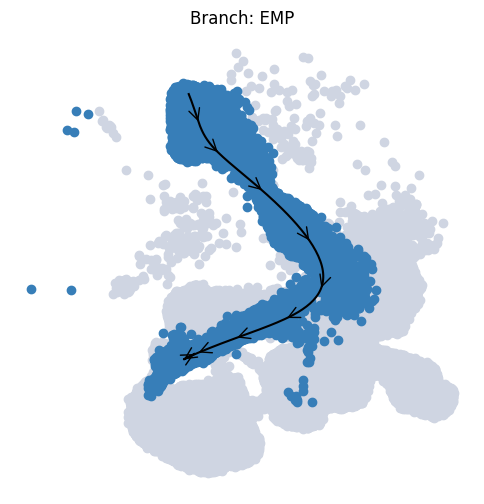

In [195]:
palantir.plot.plot_trajectory(atlas, "EMP",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:07:46,052] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (30,689) and rank = 1.0.
[2025-07-17 13:07:46,053] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:07:46,053] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:07:46,204] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: MkP'}>

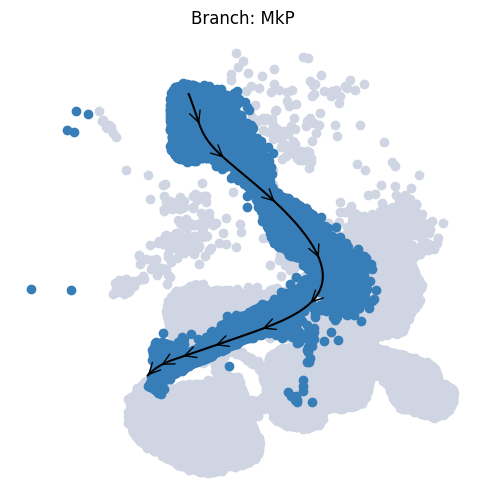

In [194]:
palantir.plot.plot_trajectory(atlas, "MkP",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:07:27,141] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (53,426) and rank = 1.0.
[2025-07-17 13:07:27,141] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:07:27,142] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:07:27,314] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Erythroid'}>

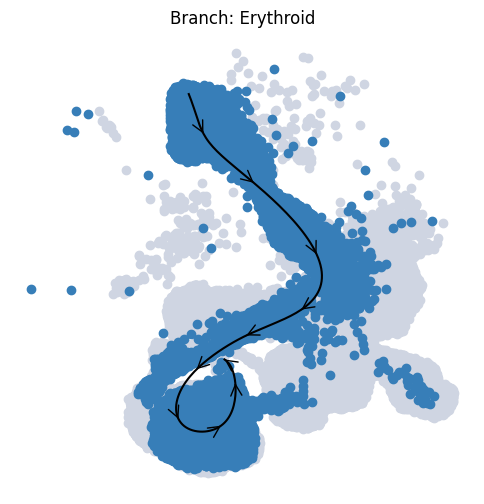

In [191]:
palantir.plot.plot_trajectory(atlas, "Erythroid",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:07:32,959] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (43,652) and rank = 1.0.
[2025-07-17 13:07:32,960] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:07:32,976] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:07:33,489] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: YS Endothelium'}>

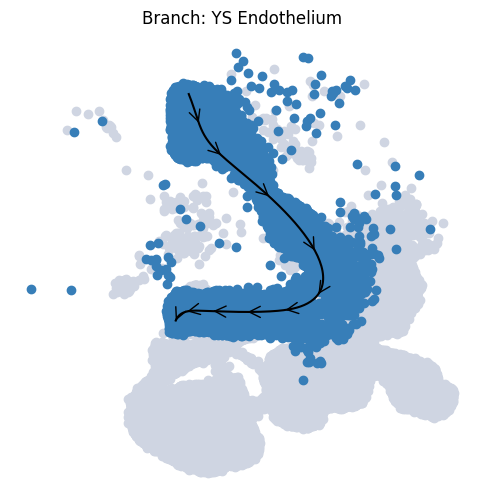

In [192]:
palantir.plot.plot_trajectory(atlas, "YS Endothelium",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:07:39,241] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (42,444) and rank = 1.0.
[2025-07-17 13:07:39,242] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:07:39,257] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:07:39,769] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Endocardium'}>

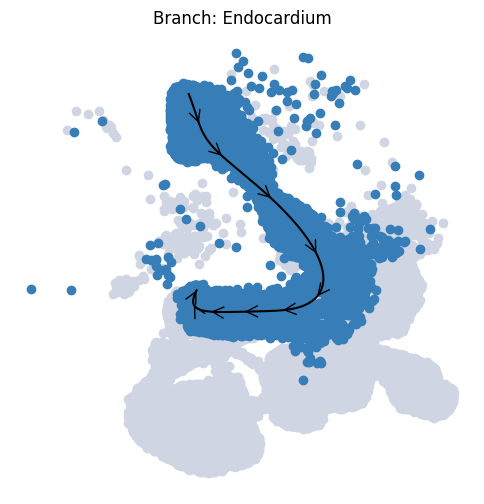

In [193]:
palantir.plot.plot_trajectory(atlas, "Endocardium",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:00,729] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (39,158) and rank = 1.0.
[2025-07-17 13:08:00,729] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:00,745] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:01,218] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: YS Mesothelium'}>

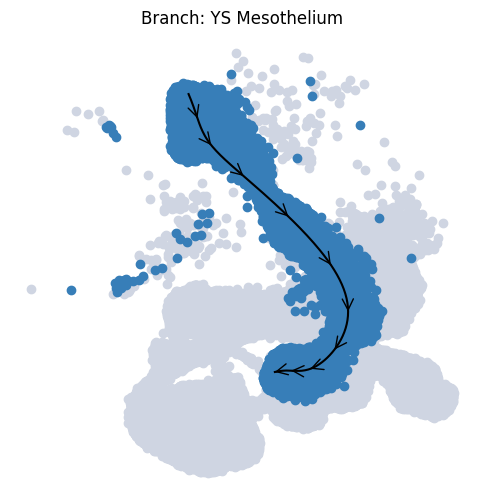

In [196]:
palantir.plot.plot_trajectory(atlas, "YS Mesothelium",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:05,374] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (38,948) and rank = 1.0.
[2025-07-17 13:08:05,375] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:05,391] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:05,891] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Mesenchyme'}>

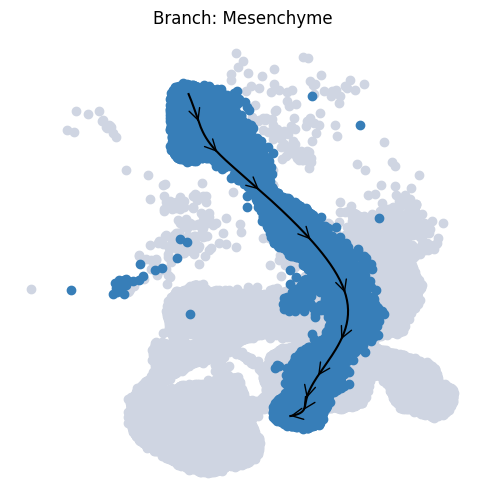

In [197]:
palantir.plot.plot_trajectory(atlas, "Mesenchyme",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:11,552] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (38,115) and rank = 1.0.
[2025-07-17 13:08:11,553] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:11,569] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:12,034] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Allantois'}>

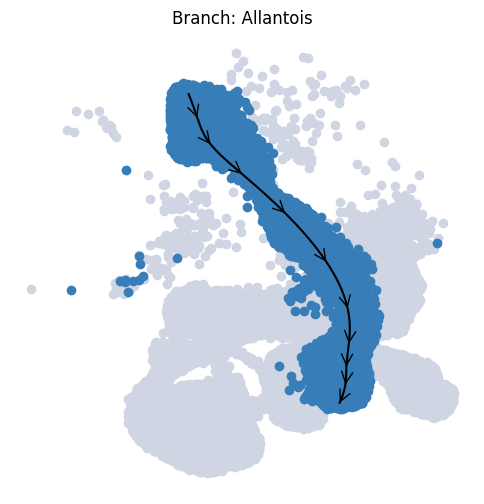

In [198]:
palantir.plot.plot_trajectory(atlas, "Allantois",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:17,045] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (36,593) and rank = 1.0.
[2025-07-17 13:08:17,045] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:17,063] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:17,533] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Epicardium'}>

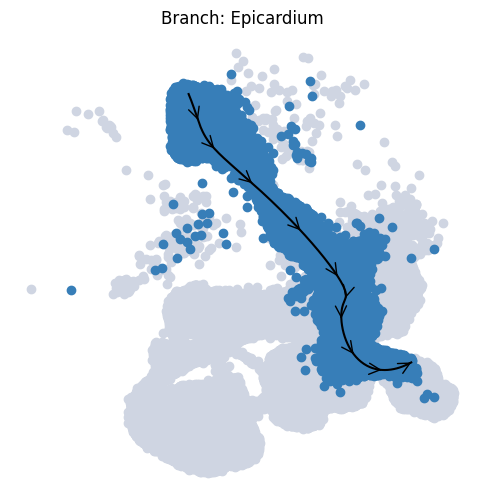

In [199]:
palantir.plot.plot_trajectory(atlas, "Epicardium",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:22,728] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (44,769) and rank = 1.0.
[2025-07-17 13:08:22,729] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:22,745] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:23,314] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Cardiomyocytes'}>

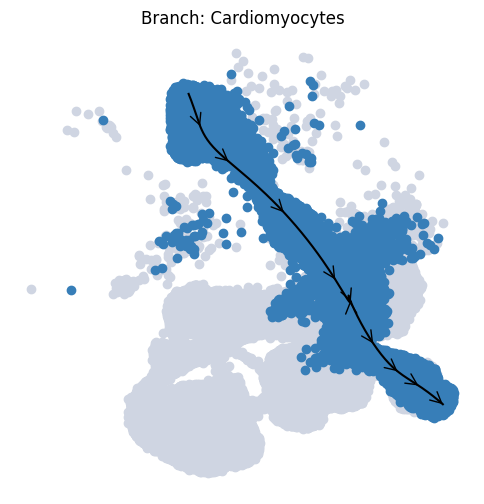

In [200]:
palantir.plot.plot_trajectory(atlas, "Cardiomyocytes",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:27,523] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (35,018) and rank = 1.0.
[2025-07-17 13:08:27,523] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:27,540] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:28,053] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Limb Mesoderm'}>

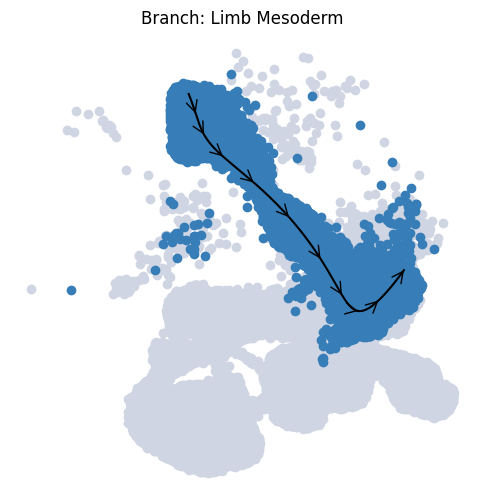

In [201]:
palantir.plot.plot_trajectory(atlas, "Limb Mesoderm",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

[2025-07-17 13:08:31,841] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (30,108) and rank = 1.0.
[2025-07-17 13:08:31,842] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:31,858] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:32,337] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: LP Mesoderm'}>

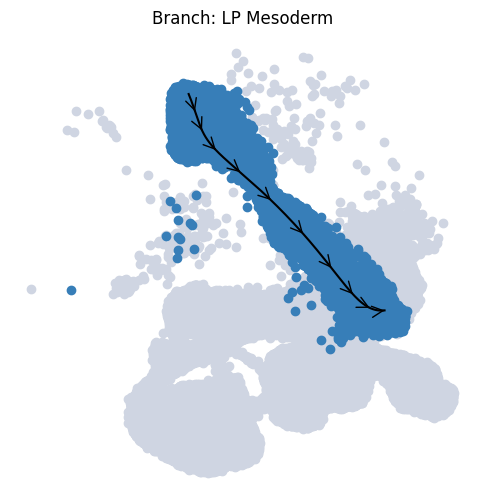

In [202]:
palantir.plot.plot_trajectory(atlas, "LP Mesoderm",figsize = (6,6), n_arrows = 10, smoothness = 0.3, scanpy_kwargs={'size': 2} )

<Axes: title={'center': 'palantir_pseudotime'}, xlabel='UMAP1', ylabel='UMAP2'>

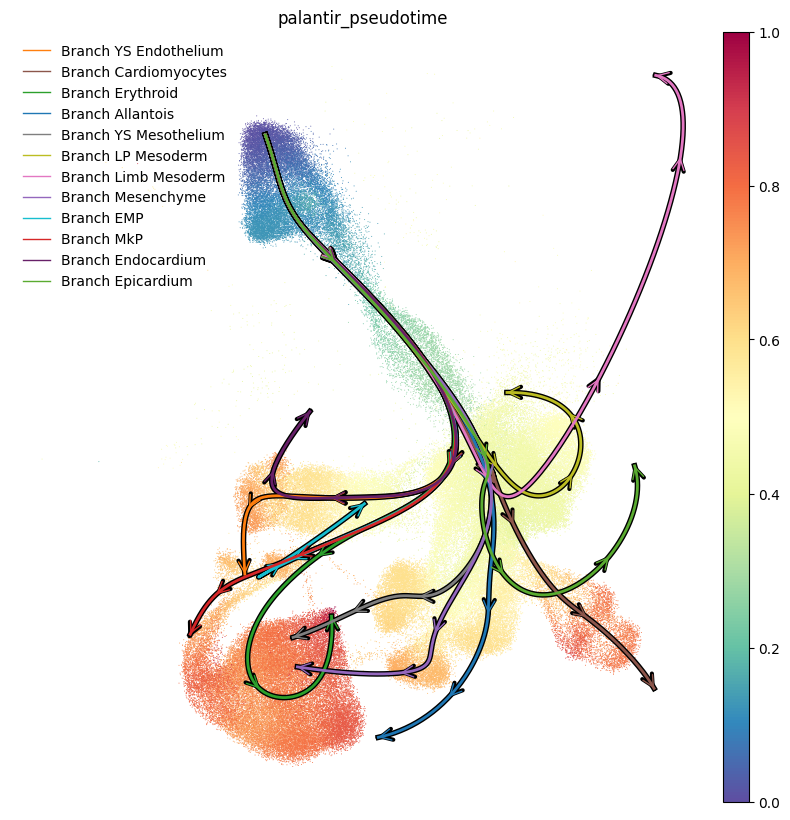

In [203]:
palantir.plot.plot_trajectories(atlas, pseudotime_interval=(0, .9), figsize = (10,10), n_arrows = 5, smoothness = 0.3, scanpy_kwargs={'size': 2})

[2025-07-17 13:08:52,532] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (31,494) and rank = 1.0.
[2025-07-17 13:08:52,533] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:08:52,534] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:08:52,695] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: EMP'}, xlabel='UMAP1', ylabel='UMAP2'>

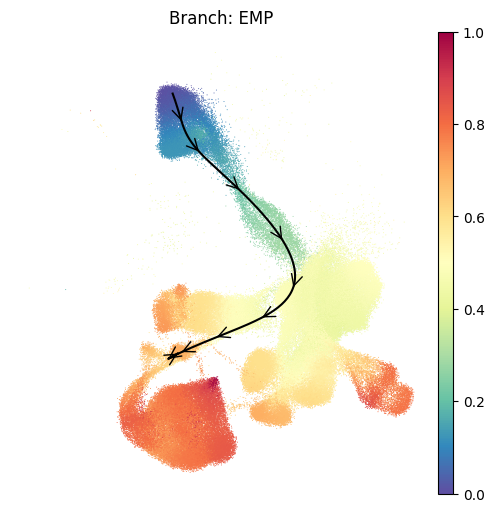

In [204]:
palantir.plot.plot_trajectory(
    atlas,
    "EMP",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:02,552] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (30,689) and rank = 1.0.
[2025-07-17 13:09:02,553] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:02,553] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:02,726] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: MkP'}, xlabel='UMAP1', ylabel='UMAP2'>

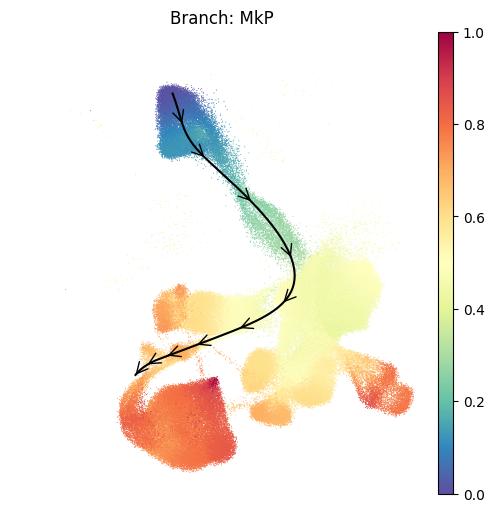

In [205]:
palantir.plot.plot_trajectory(
    atlas,
    "MkP",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:05,528] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (53,426) and rank = 1.0.
[2025-07-17 13:09:05,529] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:05,529] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:05,692] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Erythroid'}, xlabel='UMAP1', ylabel='UMAP2'>

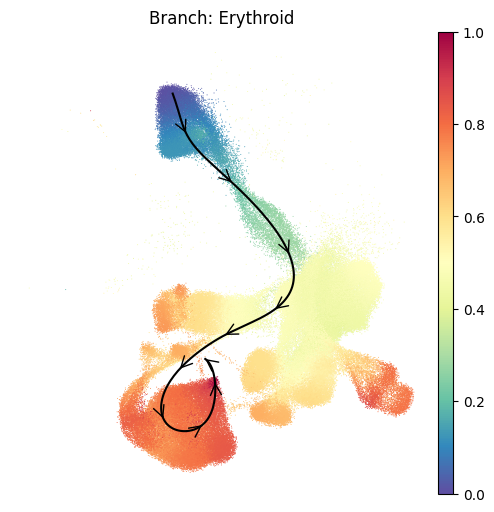

In [206]:
palantir.plot.plot_trajectory(
    atlas,
    "Erythroid",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:10,463] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (43,652) and rank = 1.0.
[2025-07-17 13:09:10,463] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:10,464] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:10,673] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: YS Endothelium'}, xlabel='UMAP1', ylabel='UMAP2'>

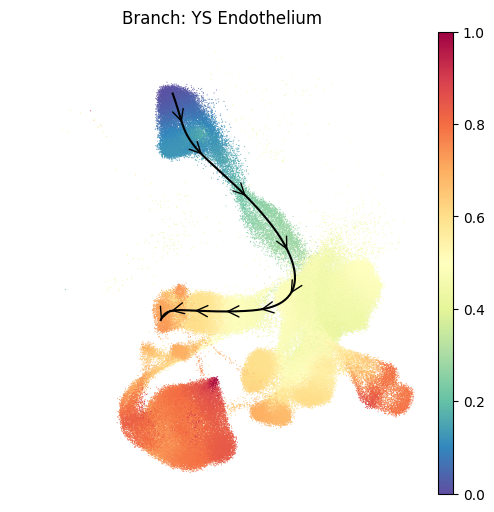

In [207]:
palantir.plot.plot_trajectory(
    atlas,
    "YS Endothelium",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:13,582] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (42,444) and rank = 1.0.
[2025-07-17 13:09:13,583] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:13,583] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:13,812] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Endocardium'}, xlabel='UMAP1', ylabel='UMAP2'>

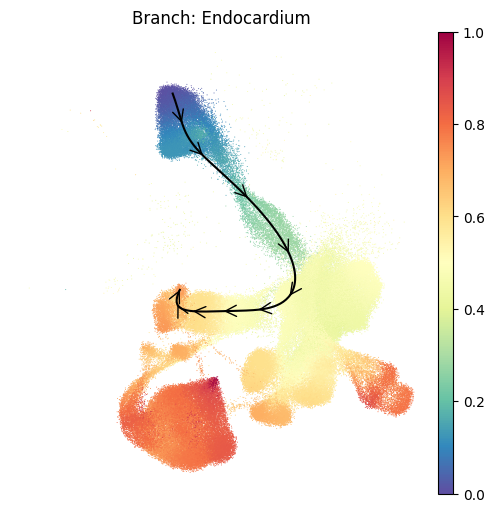

In [208]:
palantir.plot.plot_trajectory(
    atlas,
    "Endocardium",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:17,078] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (39,158) and rank = 1.0.
[2025-07-17 13:09:17,079] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:17,079] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:17,267] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: YS Mesothelium'}, xlabel='UMAP1', ylabel='UMAP2'>

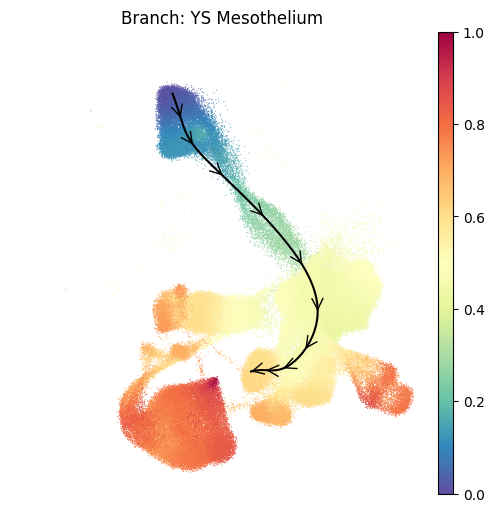

In [209]:
palantir.plot.plot_trajectory(
    atlas,
    "YS Mesothelium",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:20,654] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (38,948) and rank = 1.0.
[2025-07-17 13:09:20,654] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:20,655] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:20,874] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Mesenchyme'}, xlabel='UMAP1', ylabel='UMAP2'>

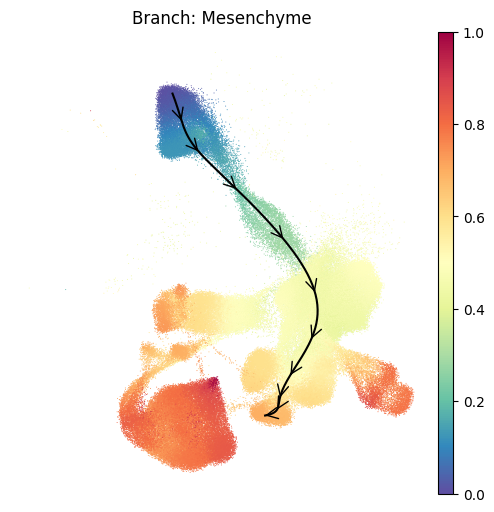

In [210]:
palantir.plot.plot_trajectory(
    atlas,
    "Mesenchyme",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:23,754] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (38,115) and rank = 1.0.
[2025-07-17 13:09:23,754] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:23,755] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:23,914] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Allantois'}, xlabel='UMAP1', ylabel='UMAP2'>

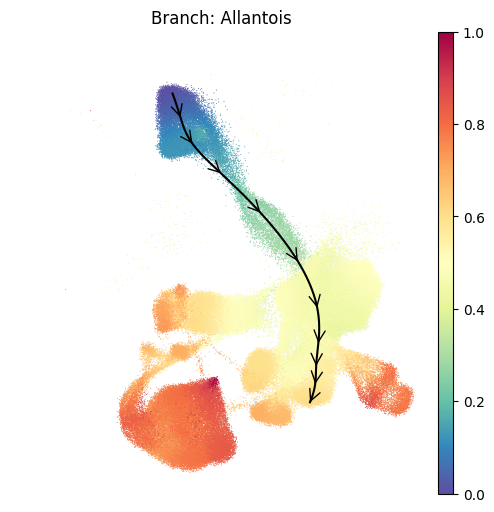

In [211]:
palantir.plot.plot_trajectory(
    atlas,
    "Allantois",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:29,910] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (36,593) and rank = 1.0.
[2025-07-17 13:09:29,911] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:29,911] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:30,087] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Epicardium'}, xlabel='UMAP1', ylabel='UMAP2'>

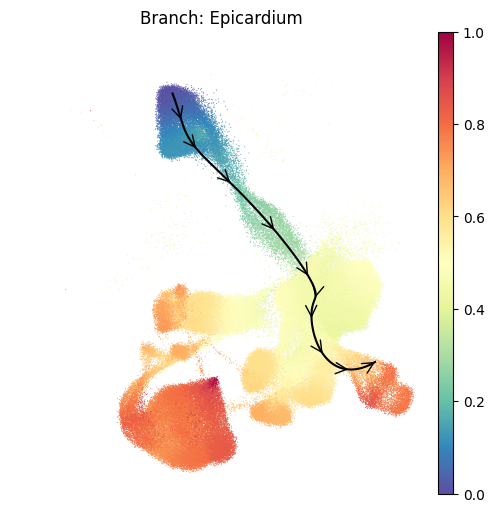

In [212]:
palantir.plot.plot_trajectory(
    atlas,
    "Epicardium",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:33,526] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (44,769) and rank = 1.0.
[2025-07-17 13:09:33,526] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:33,527] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:33,771] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Cardiomyocytes'}, xlabel='UMAP1', ylabel='UMAP2'>

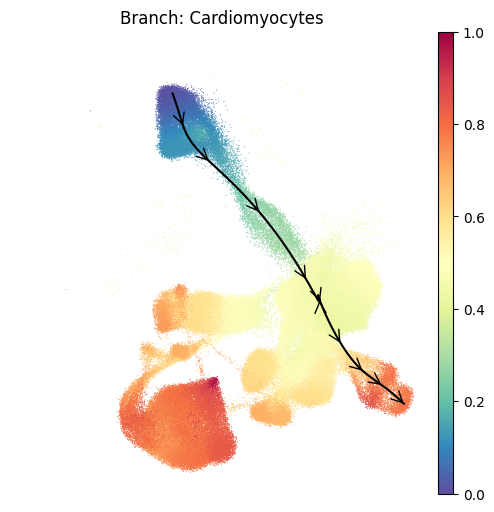

In [213]:
palantir.plot.plot_trajectory(
    atlas,
    "Cardiomyocytes",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:37,232] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (35,018) and rank = 1.0.
[2025-07-17 13:09:37,233] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:37,233] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:37,372] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Limb Mesoderm'}, xlabel='UMAP1', ylabel='UMAP2'>

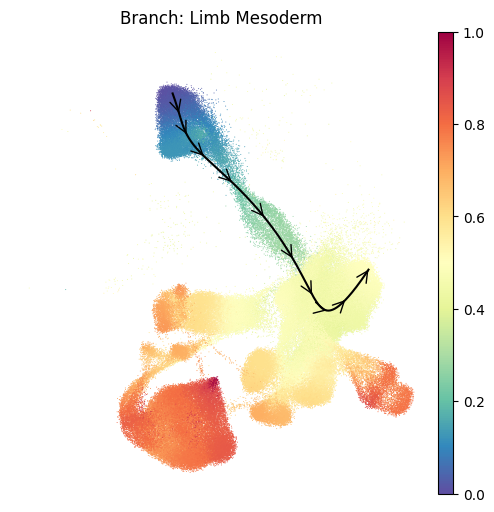

In [214]:
palantir.plot.plot_trajectory(
    atlas,
    "Limb Mesoderm",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

[2025-07-17 13:09:43,089] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (30,108) and rank = 1.0.
[2025-07-17 13:09:43,089] [INFO    ] Using covariance function Matern52(ls=0.6036942238999211).
[2025-07-17 13:09:43,090] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-07-17 13:09:43,246] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: LP Mesoderm'}, xlabel='UMAP1', ylabel='UMAP2'>

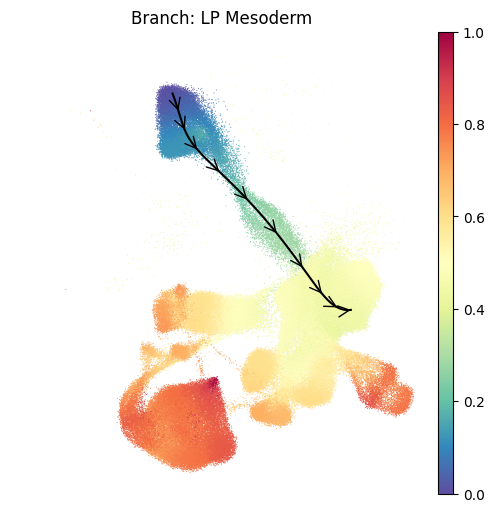

In [215]:
palantir.plot.plot_trajectory(
    atlas,
    "LP Mesoderm",
    figsize=(6, 6),
    n_arrows=10,
    smoothness=0.3,
    cell_color="palantir_pseudotime",        # anything ≠ 'branch_selection'
    scanpy_kwargs={'size': 2}                # now this will be applied
)

In [216]:
gene_trends_atlas = palantir.presults.compute_gene_trends(
    atlas,
    expression_key="MAGIC_imputed_data",
)

YS Endothelium
[2025-07-17 13:10:27,350] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (43,652) and rank = 1.0.
[2025-07-17 13:10:27,350] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-07-17 13:10:27,864] [INFO    ] Sigma interpreted as element-wise standard deviation.
Cardiomyocytes
[2025-07-17 13:10:32,265] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (44,769) and rank = 1.0.
[2025-07-17 13:10:32,266] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-07-17 13:10:32,763] [INFO    ] Sigma interpreted as element-wise standard deviation.
Erythroid
[2025-07-17 13:10:37,740] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (53,426) and rank = 1.0.
[2025-07-17 13:10:37,741] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-07-17 13:10:38,254] [INFO    ] Sigma interpreted as element-wise standard deviation.
Allantois
[2025-07-17 13:10:42,886] [INFO    ] Using sparse 

In [217]:
atlas

AnnData object with n_obs × n_vars = 170950 × 27669
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'cell', 'sample', 'embryo_version', 'stage', 'somite_count', 'anatomy', 'S_score', 'G2M_score', 'phase', 'louvain', 'leiden', 'celltype_PijuanSala2019', 'celltype_extended_atlas', 'sizeFactor', 'palantir_pseudotime', 'palantir_entropy'
    var: 'id', 'mgi_symbol', 'symbol'
    uns: 'celltype_extended_atlas_colors', 'DM_EigenValues', 'palantir_waypoints', 'palantir_fates_colors'
    obsm: 'X_PCA', 'X_UMAP', 'X_umap', 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'gene_trends_Allantois', 'gene_trends_YS Endothelium', 'gene_trends_Erythroid', 'gene_trends_MkP', 'gene_trends_Mesenchyme', 'gene_trends_Cardiomyocytes', 'gene_trends_Limb Mesoderm', 'gene_trends_YS Mesothelium', 'gene_trends_LP Mesoderm', 'gene_trends_EMP', 'gene_trends_Endocardium', 'gene_trends_Epicardium'
    layers: 'MAGIC_imputed_data'

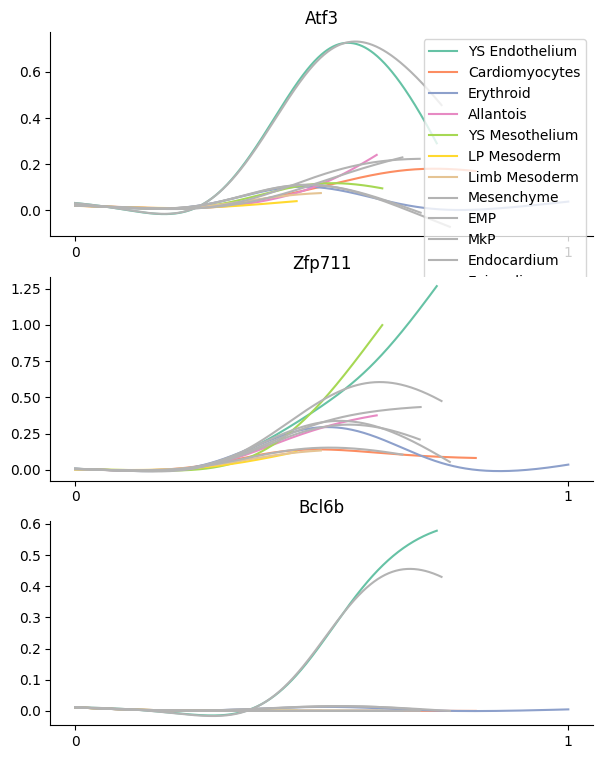

In [218]:
genes = ["Atf3", "Zfp711", "Bcl6b"]
palantir.plot.plot_gene_trends(atlas, genes)
plt.show()

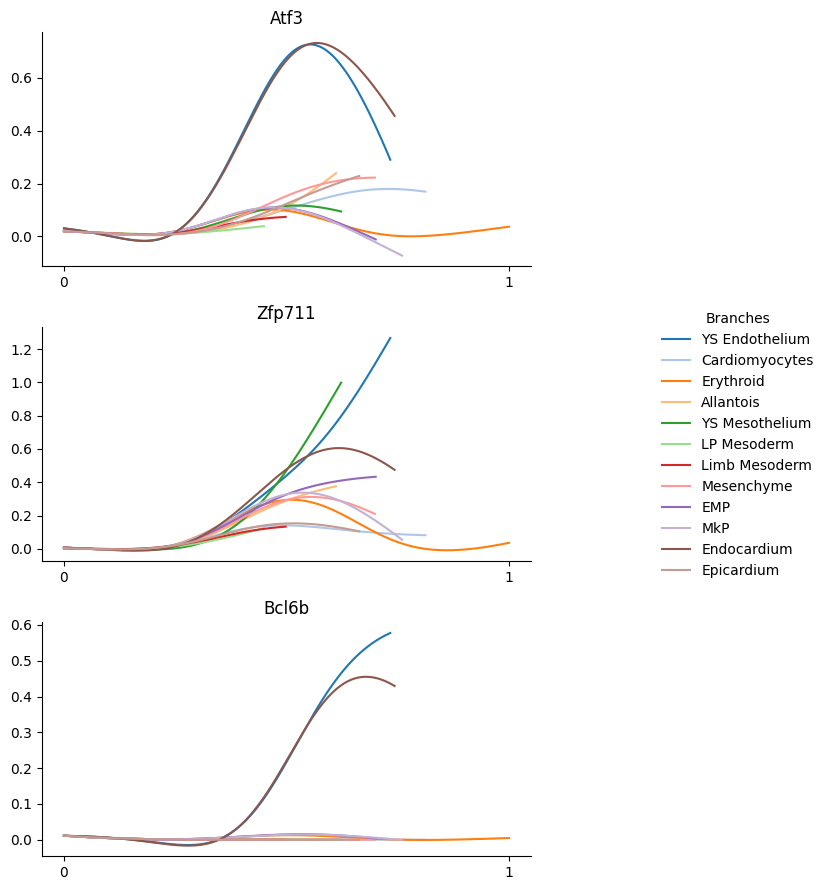

In [220]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from palantir.plot import plot_gene_trends

genes = ["Atf3", "Zfp711", "Bcl6b"]

# 1. Draw the multi‐panel gene trends and grab the Figure
fig = plot_gene_trends(atlas, genes)

# 2. Pull out all the Axes
axes = fig.axes

# 3. Get a unified set of handles & labels from the first axes
handles, labels = axes[0].get_legend_handles_labels()

# 4. Build a bigger palette (tab20 has up to 20 distinct colors)
#    Matplotlib ≥3.7 preferred API:
cmap = mpl.colormaps['tab20']
new_colors = [cmap(i) for i in range(len(handles))]

# 5. Recolor each line in every subplot
for ax in axes:
    for line, color in zip(ax.get_lines(), new_colors):
        if line.get_label() in labels:
            line.set_color(color)

# 6. Remove individual legends if present
for ax in axes:
    leg = ax.get_legend()
    if leg is not None:
        ax.get_legend().remove()

# 7. Add one consolidated legend to the right
fig.legend(
    handles, 
    labels, 
    loc='center right', 
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    title='Branches'
)

# 8. Adjust layout to make room for the legend
fig.tight_layout(rect=[0, 0, 0.8, 1])

plt.show()


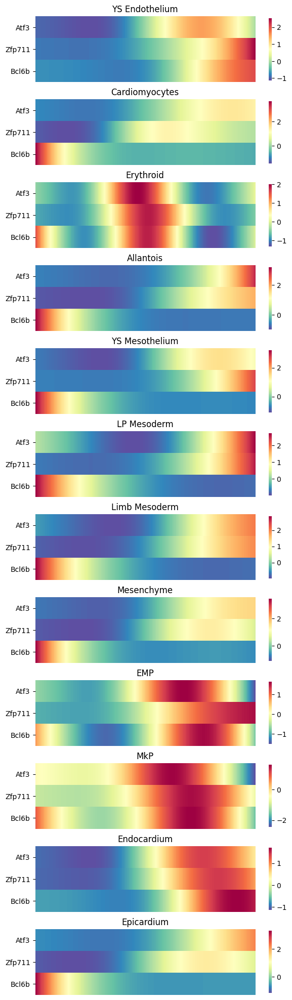

In [221]:
palantir.plot.plot_gene_trend_heatmaps(atlas, genes)
plt.show()

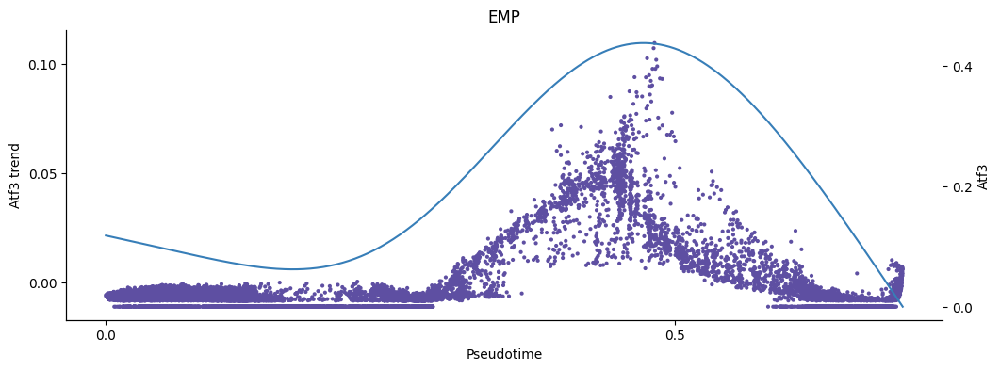

In [226]:
palantir.plot.plot_trend(atlas, branch_name = "EMP", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

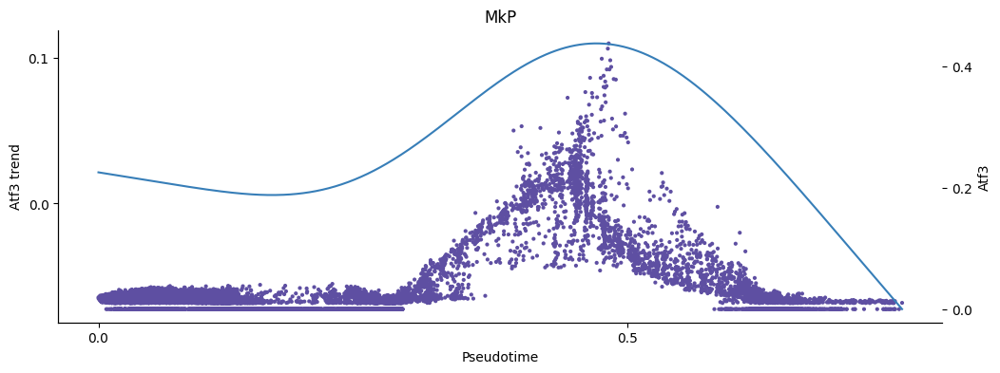

In [227]:
palantir.plot.plot_trend(atlas, branch_name = "MkP", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

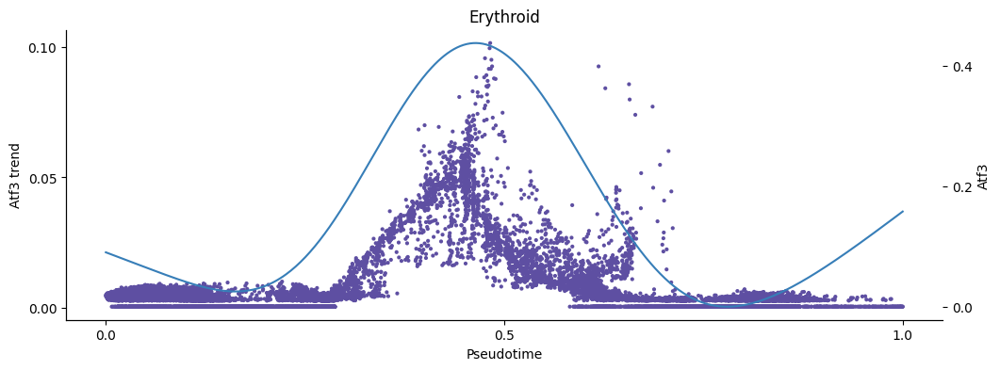

In [228]:
palantir.plot.plot_trend(atlas, branch_name = "Erythroid", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

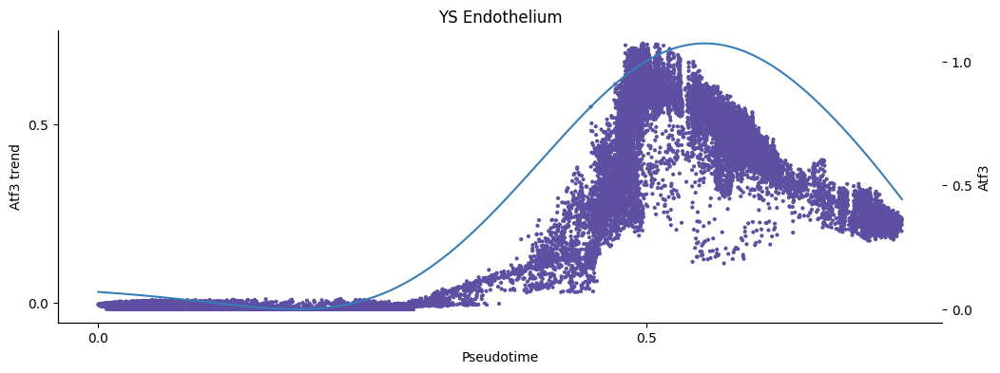

In [229]:
palantir.plot.plot_trend(atlas, branch_name = "YS Endothelium", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

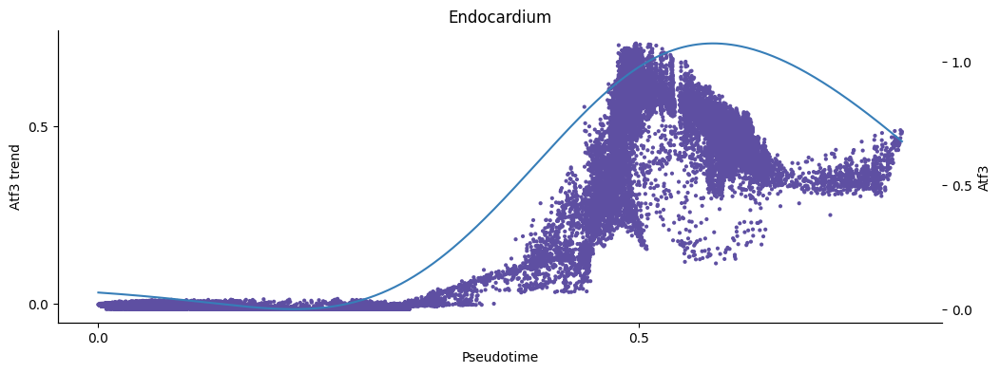

In [230]:
palantir.plot.plot_trend(atlas, branch_name = "Endocardium", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

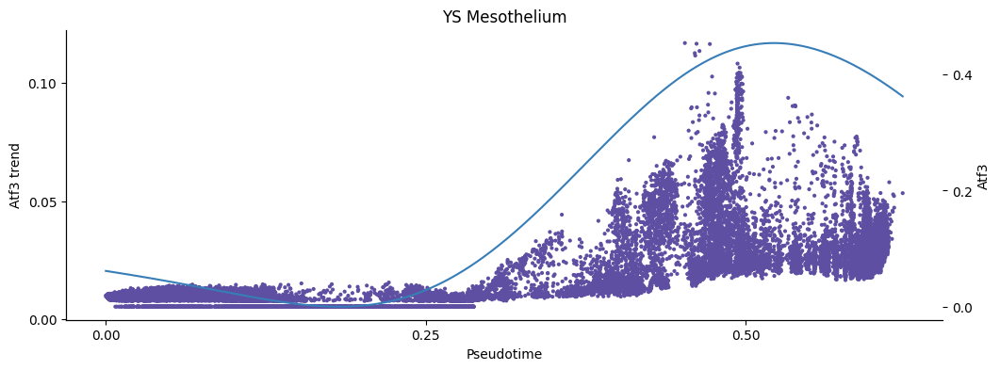

In [231]:
palantir.plot.plot_trend(atlas, branch_name = "YS Mesothelium", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

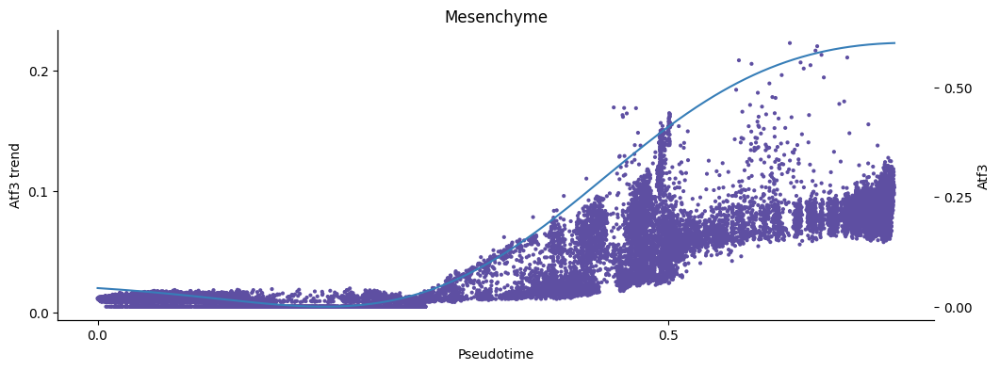

In [232]:
palantir.plot.plot_trend(atlas, branch_name = "Mesenchyme", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

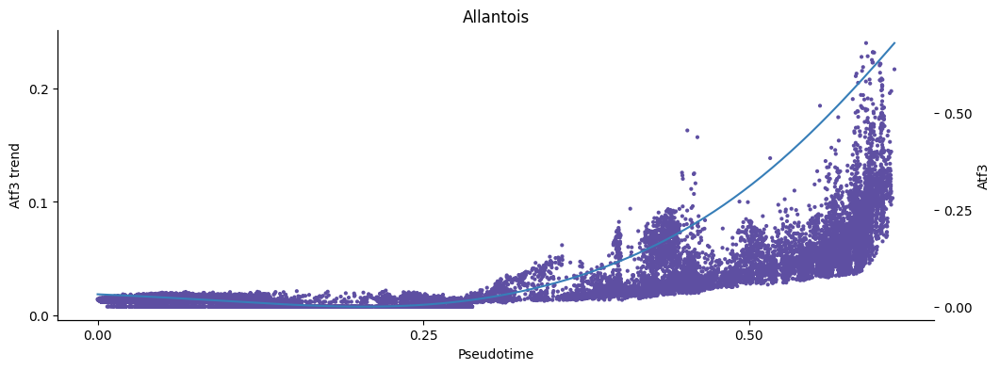

In [233]:
palantir.plot.plot_trend(atlas, branch_name = "Allantois", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

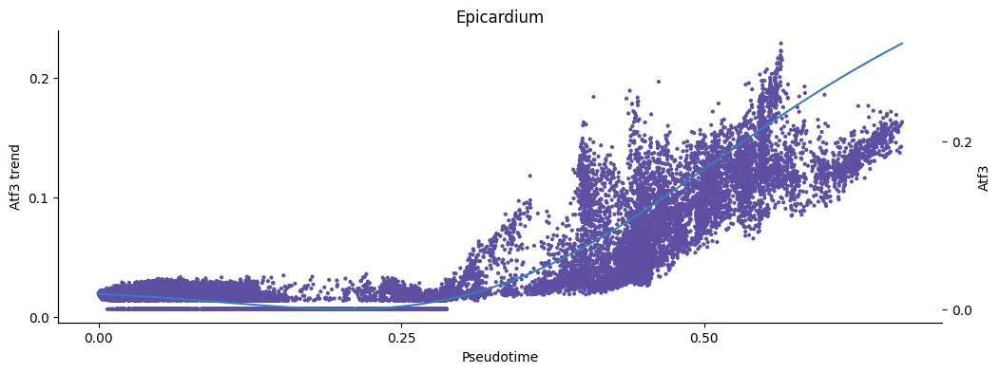

In [236]:
palantir.plot.plot_trend(atlas, branch_name = "Epicardium", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

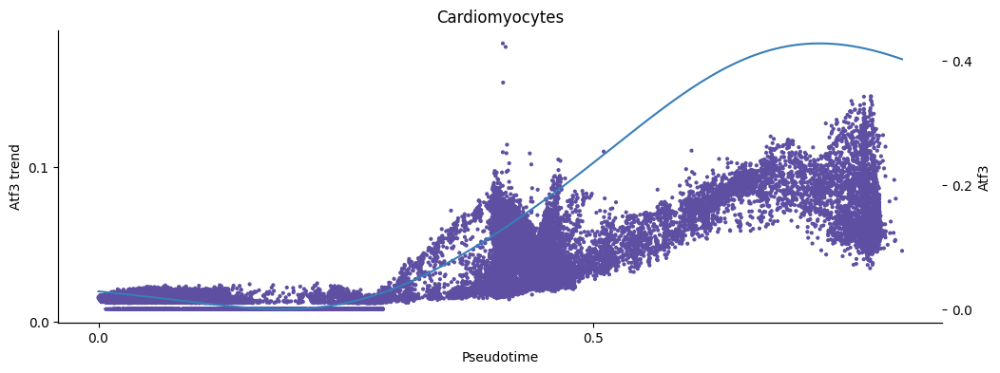

In [237]:
palantir.plot.plot_trend(atlas, branch_name = "Cardiomyocytes", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

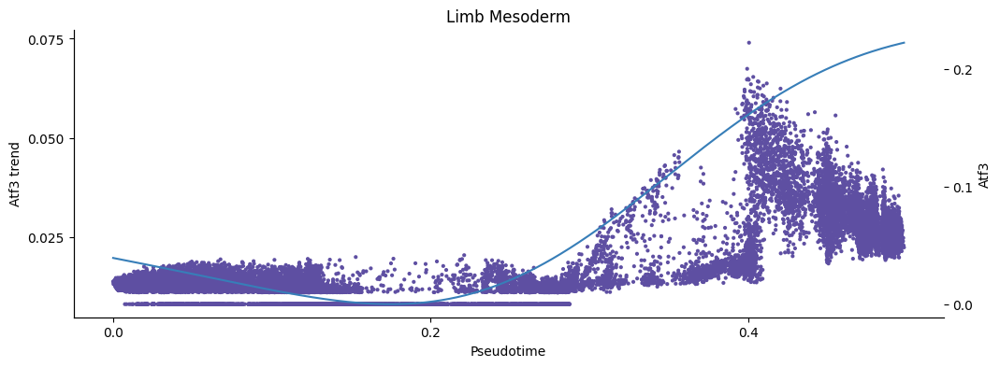

In [238]:
palantir.plot.plot_trend(atlas, branch_name = "Limb Mesoderm", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

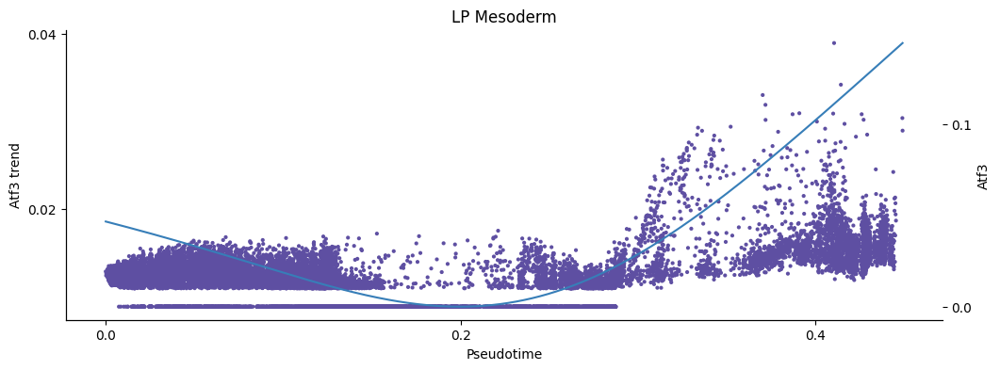

In [239]:
palantir.plot.plot_trend(atlas, branch_name = "LP Mesoderm", gene = "Atf3", position_layer="MAGIC_imputed_data")
plt.show()

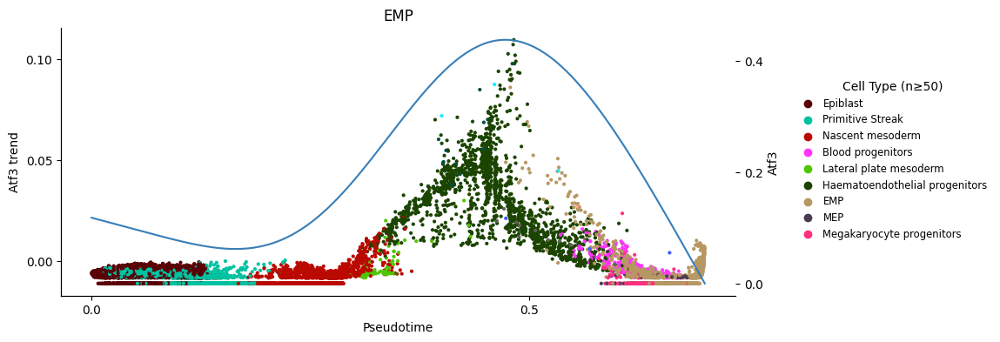

In [254]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "EMP"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.9)

plt.show()


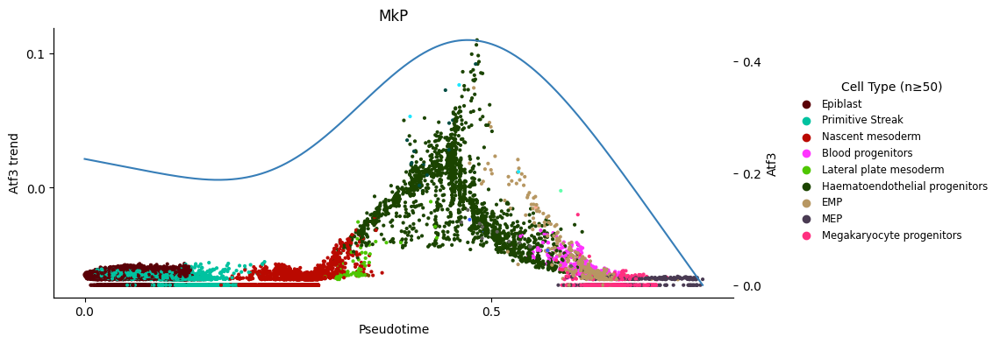

In [255]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "MkP"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.9)

plt.show()


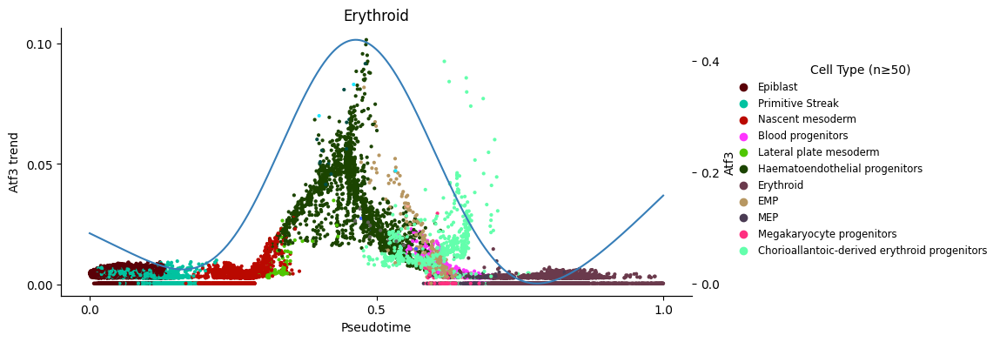

In [257]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Erythroid"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


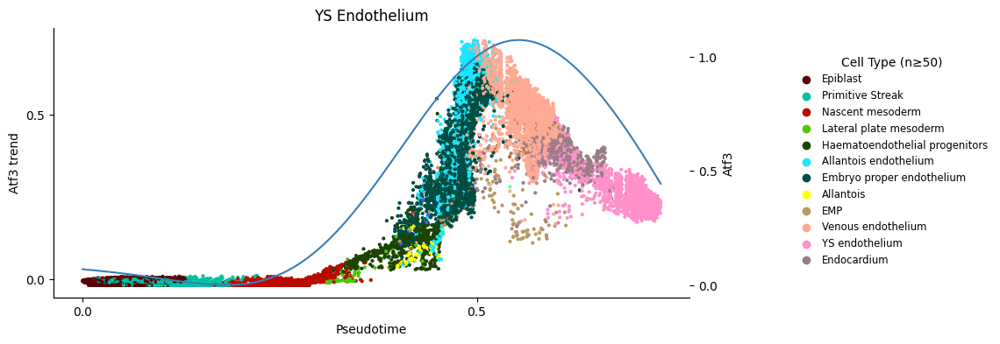

In [258]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "YS Endothelium"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


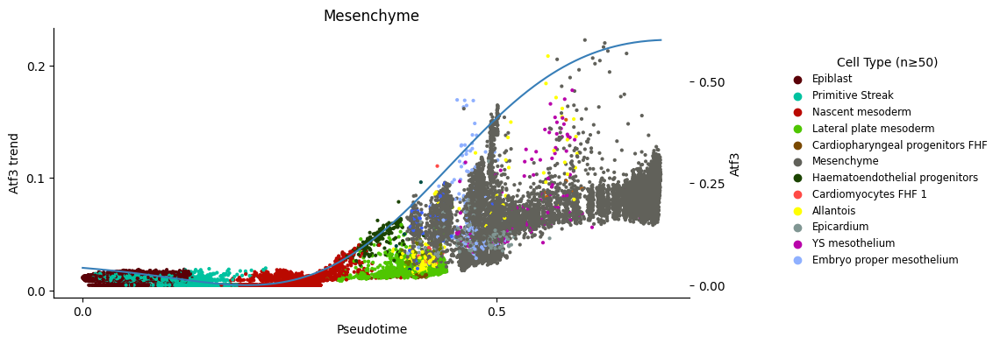

In [259]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Mesenchyme"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


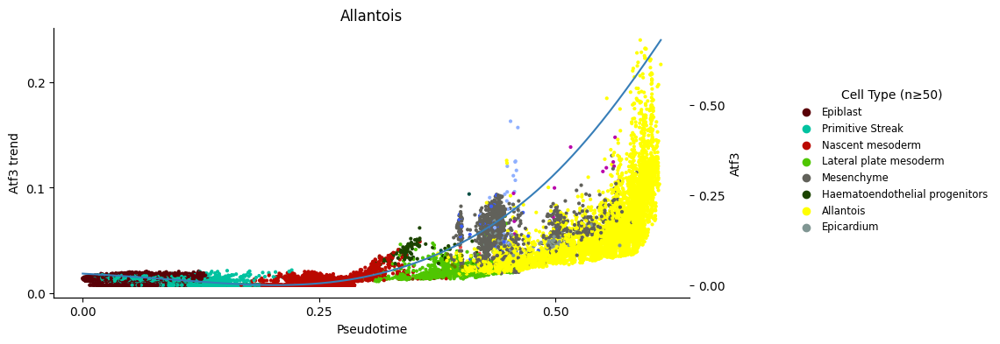

In [260]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Allantois"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


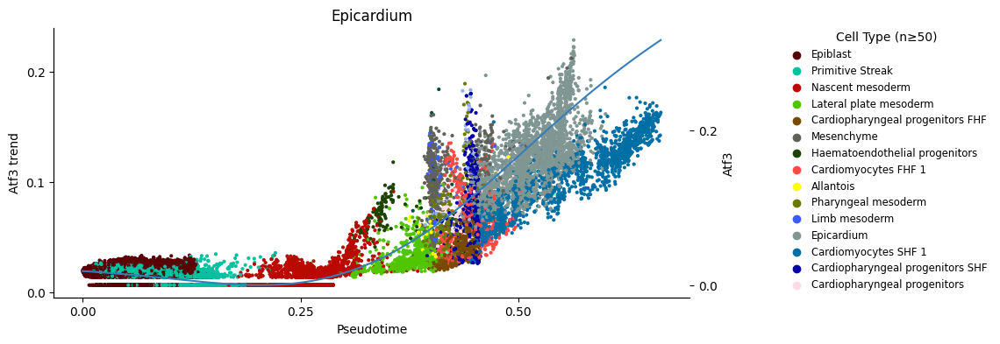

In [262]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Epicardium"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


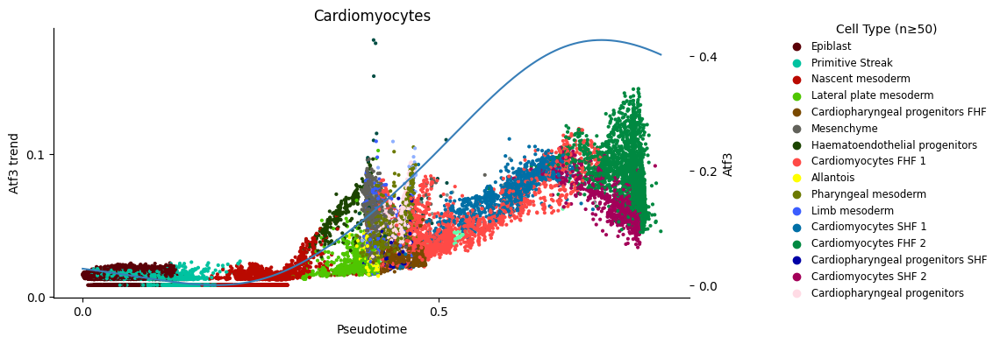

In [263]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Cardiomyocytes"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


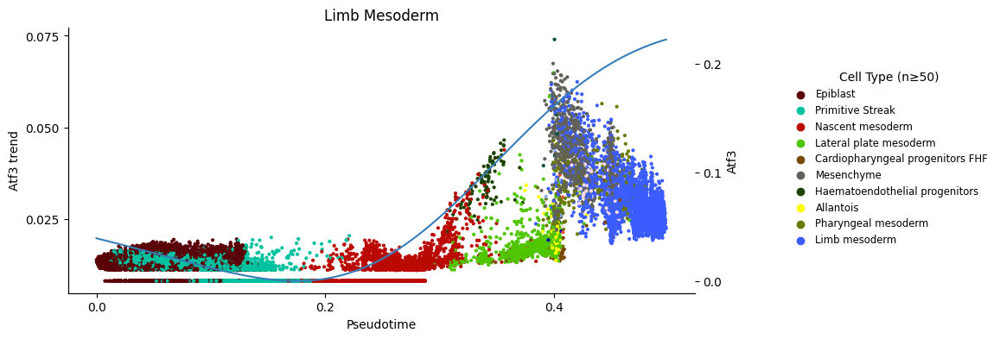

In [264]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Limb Mesoderm"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


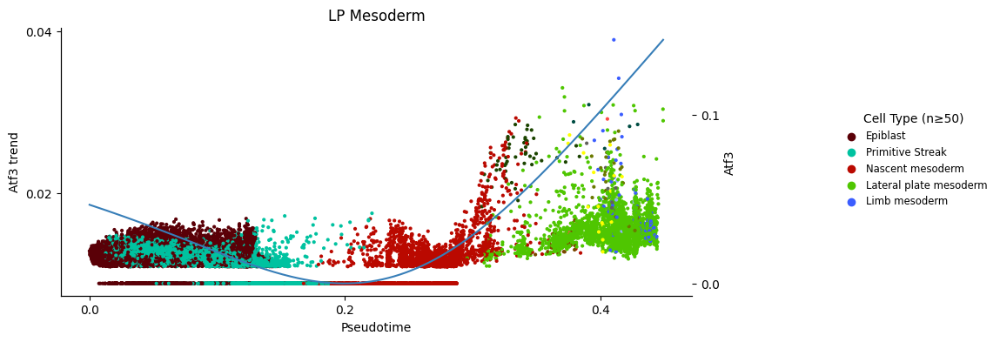

In [265]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "LP Mesoderm"
gene        = "Atf3"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


# Zfp711

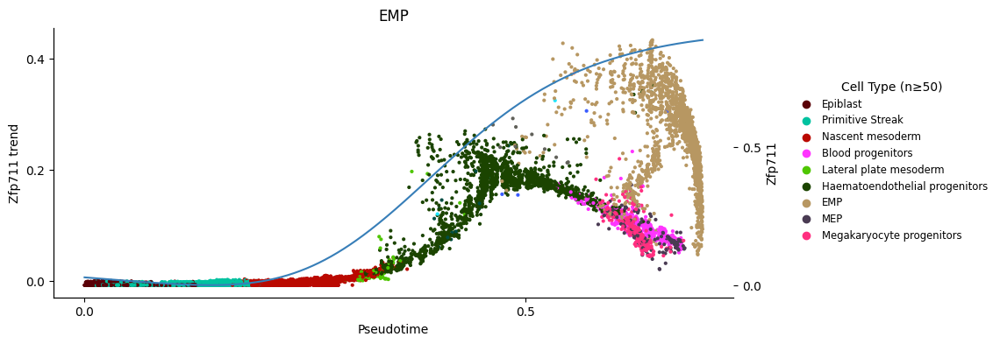

In [267]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "EMP"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.9)

plt.show()


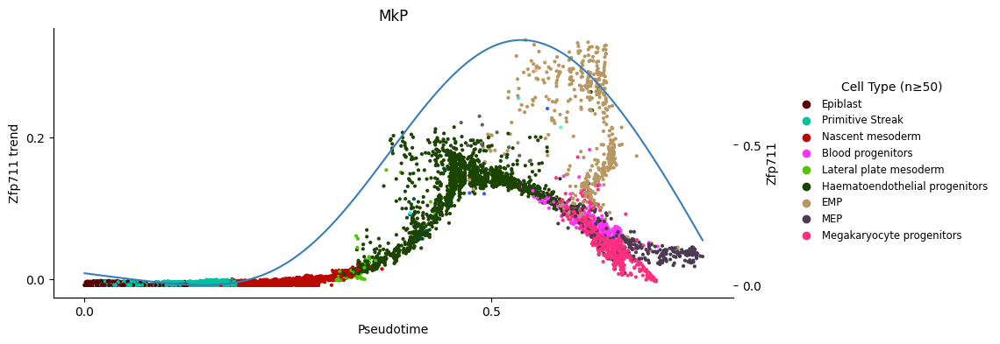

In [268]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "MkP"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.9)

plt.show()


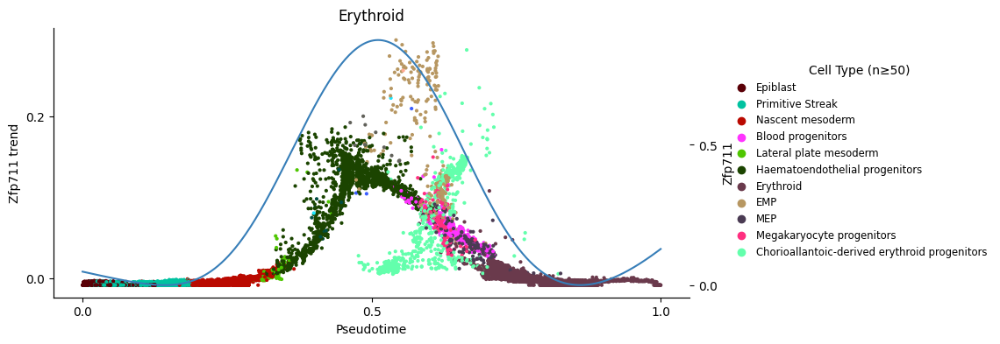

In [269]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Erythroid"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


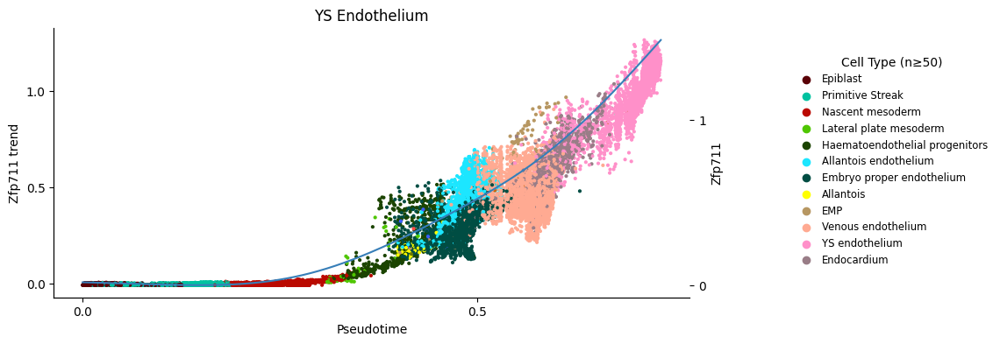

In [270]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "YS Endothelium"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


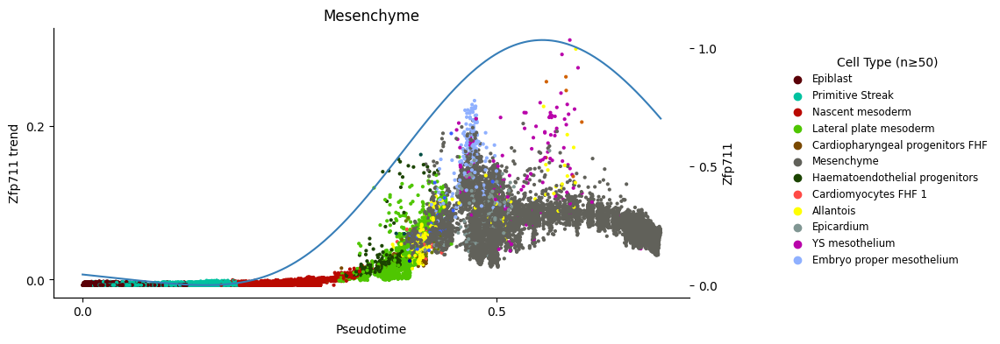

In [271]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Mesenchyme"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


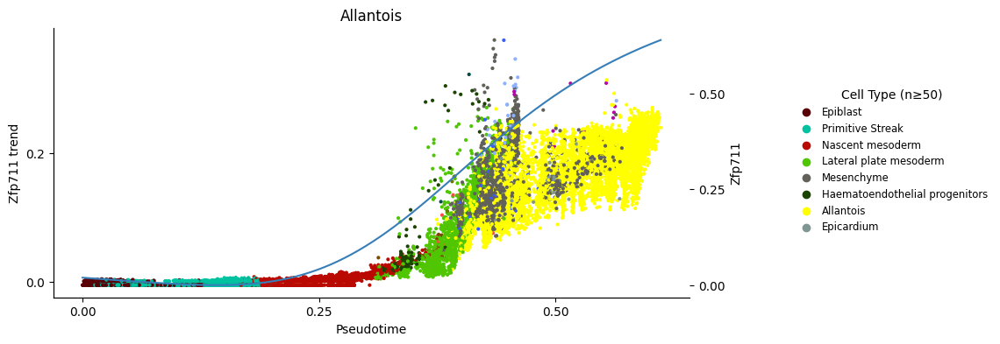

In [272]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Allantois"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


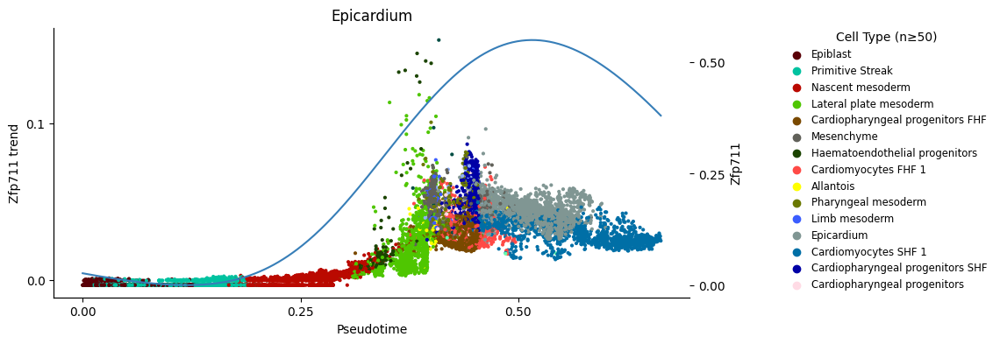

In [273]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Epicardium"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


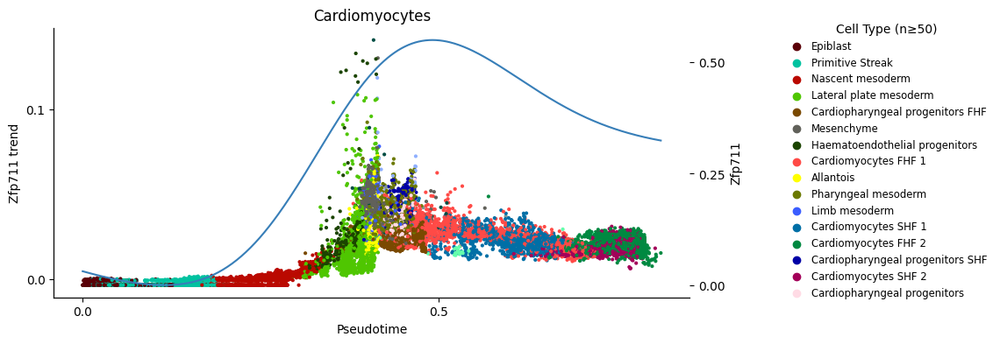

In [274]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Cardiomyocytes"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


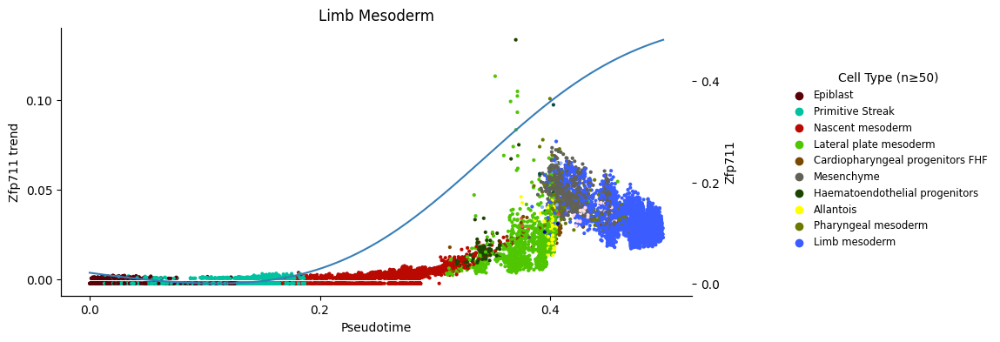

In [275]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Limb Mesoderm"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


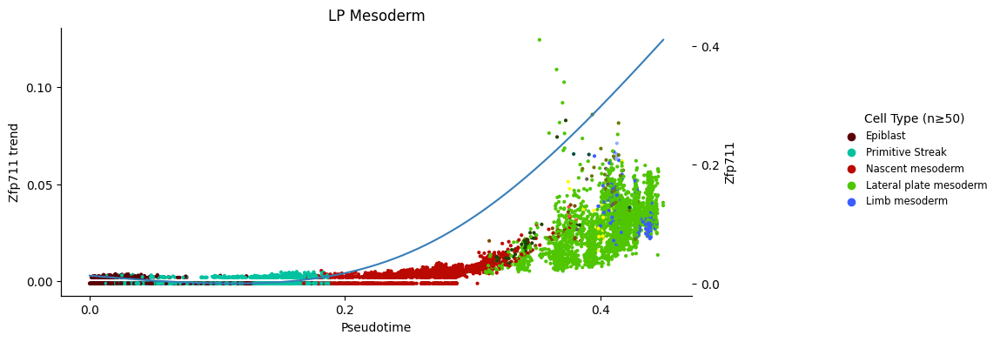

In [276]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "LP Mesoderm"
gene        = "Zfp711"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


# Bcl6b

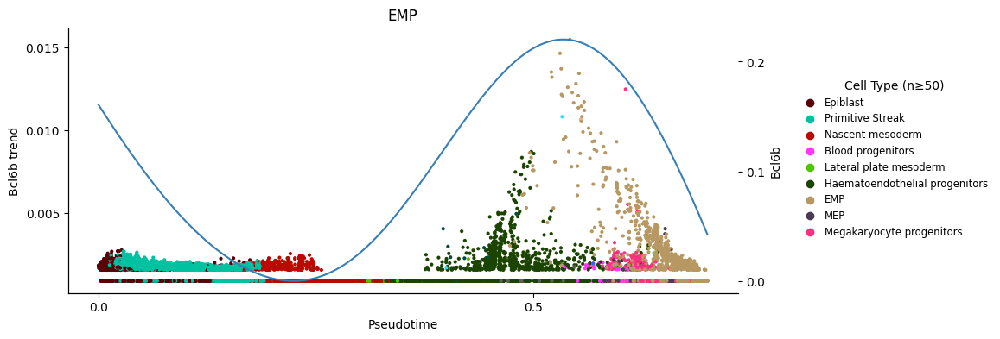

In [277]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "EMP"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.9)

plt.show()


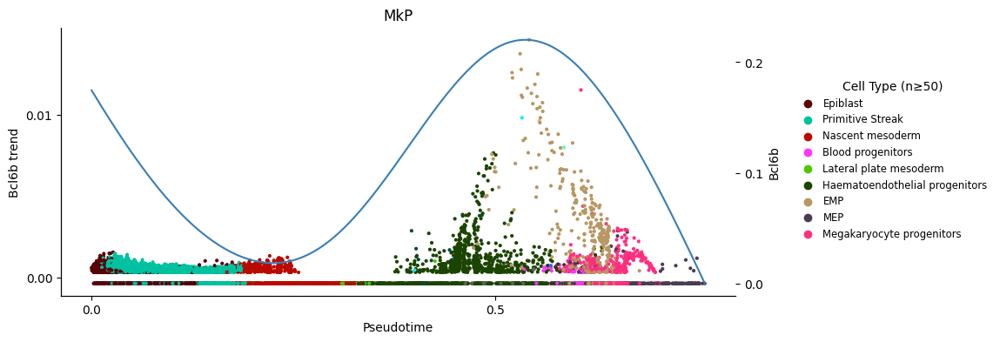

In [278]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "MkP"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.9)

plt.show()


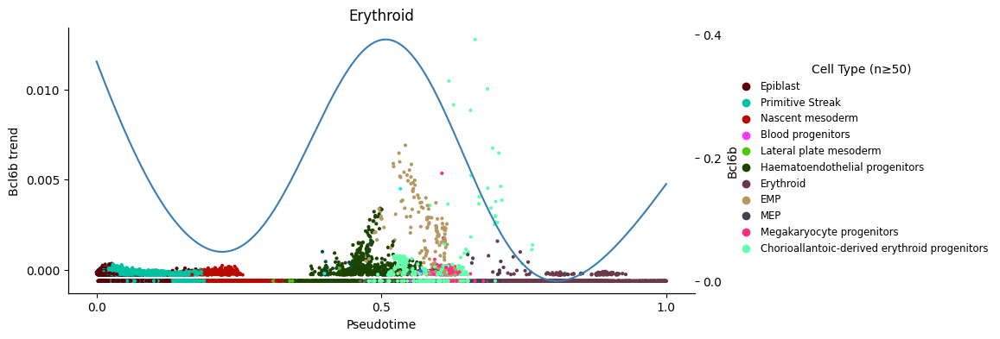

In [279]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Erythroid"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


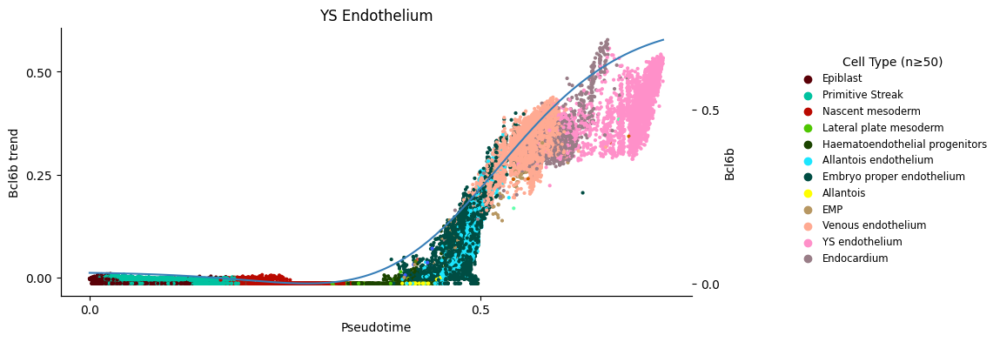

In [280]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "YS Endothelium"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


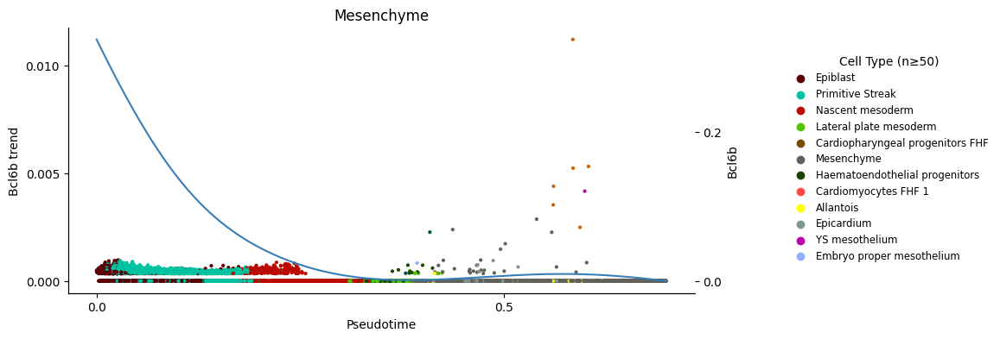

In [281]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Mesenchyme"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


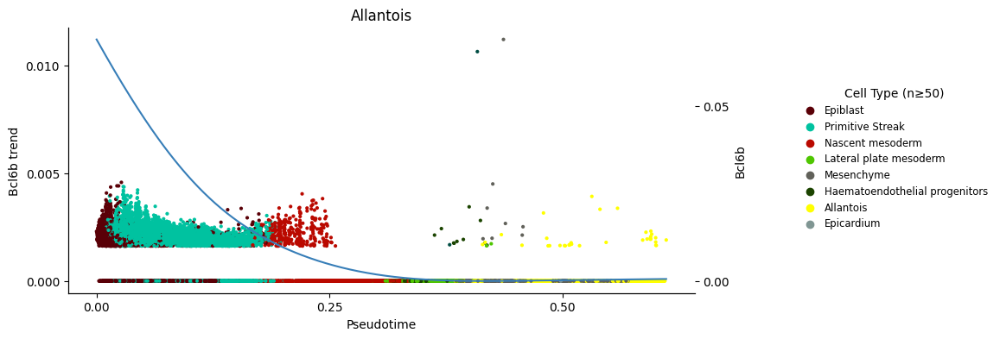

In [282]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Allantois"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


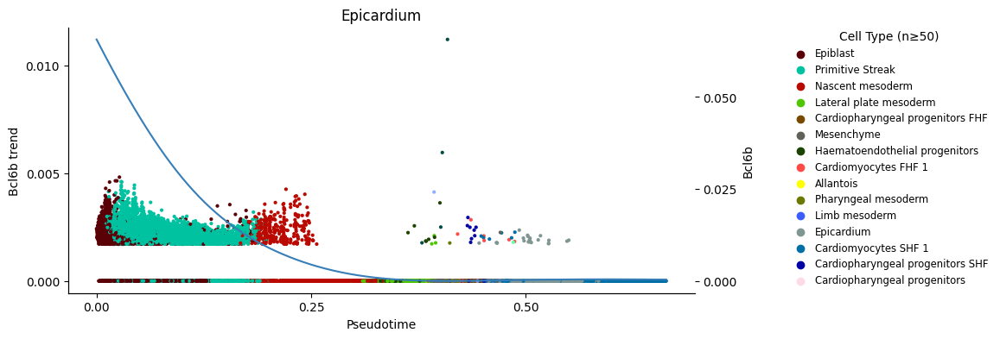

In [283]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Epicardium"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


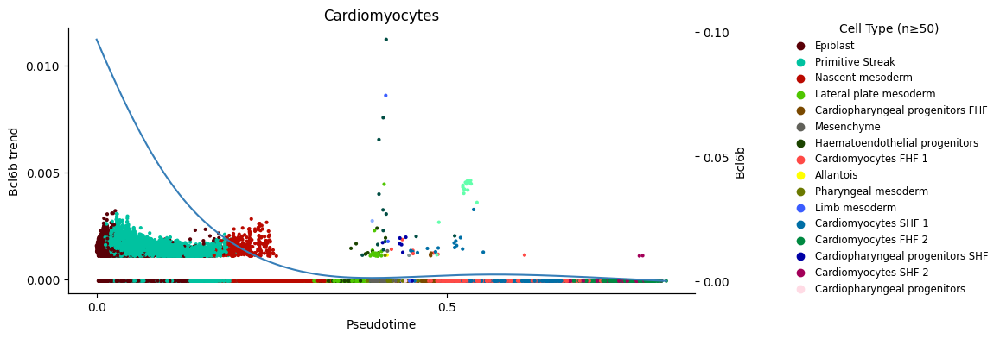

In [284]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Cardiomyocytes"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


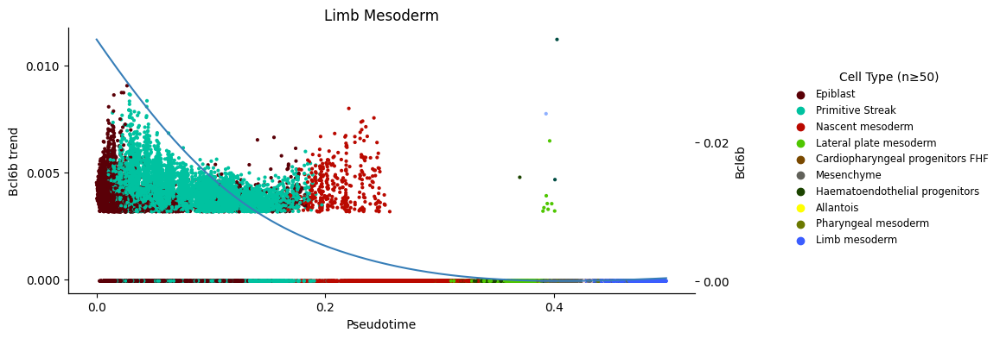

In [285]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "Limb Mesoderm"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


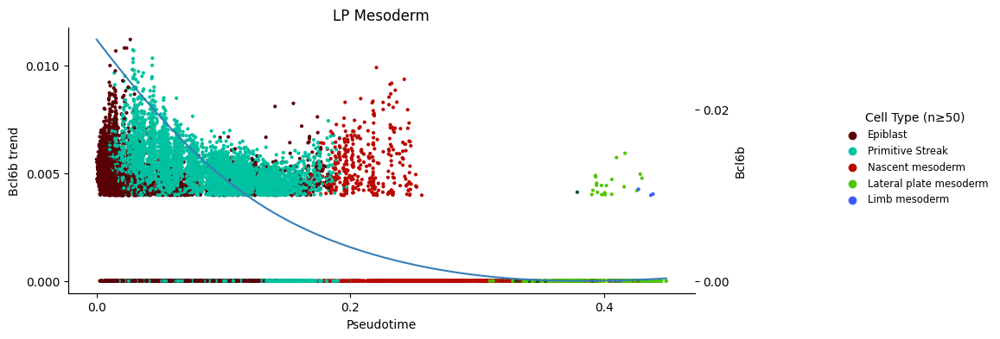

In [286]:
import pandas as pd
import matplotlib.pyplot as plt
from palantir.plot import plot_trend

branch_name = "LP Mesoderm"
gene        = "Bcl6b"

# 1) Draw your plot and grab fig & ax
fig, ax_primary = plot_trend(
    atlas,
    branch_name=branch_name,
    gene=gene,
    position_layer="MAGIC_imputed_data",
    color="celltype_extended_atlas",
    palette="tab20",
    nticks=3,
    legend_anchor=(1.2, 0.5),
    legend_fontsize="small",
    figsize=(10, 4),
)

# 2) Compute mask & counts for cells on that branch
branch_masks = atlas.obsm['branch_masks']
mask         = branch_masks[branch_name] > 0
counts = atlas.obs.loc[mask, 'celltype_extended_atlas'].value_counts()

# 3) Decide which cell‑types to keep (n>=10), in descending order
keep_cts = counts[counts >= 50].sort_values(ascending=False).index.tolist()

# 4) Locate the Axes that has the old legend
legend_ax = next(ax for ax in fig.axes if ax.get_legend() is not None)

# 5) Pull its handles & labels
handles, labels = legend_ax.get_legend_handles_labels()

# 6) Filter them
new_handles = []
new_labels  = []
for h, lab in zip(handles, labels):
    if lab in keep_cts:
        new_handles.append(h)
        new_labels.append(lab)

# 7) Remove the old legend
legend_ax.get_legend().remove()

# 8) Draw a fresh, two‑column legend on the figure
fig.legend(
    new_handles,
    new_labels,
    title="Cell Type (n≥50)",
    loc="center right",
    bbox_to_anchor=(1.2, 0.5),
    frameon=False,
    fontsize="small",
    ncol=1,
    columnspacing=0.8,
    handletextpad=0.5
)

# 9) Give it room
fig.subplots_adjust(right=0.85)

plt.show()


# Clustering - Gene Expression

In [289]:
more_genes = atlas.var_names[:5000]
more_genes

Index(['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15',
       'Lypla1', 'Gm37988', 'Tcea1',
       ...
       'Mageh1', 'Foxr2', 'Rragb', 'Klf8', 'Ubqln2', 'Cypt3', 'Kctd12b',
       'RP23-106P7.5', '2210013O21Rik', 'Spin2c'],
      dtype='object', length=5000)

In [290]:
communities = palantir.presults.cluster_gene_trends(atlas, "Erythroid", more_genes)

/home/ridvan/venv-jlab/lib/python3.11/site-packages/anndata/_core/anndata.py:381: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


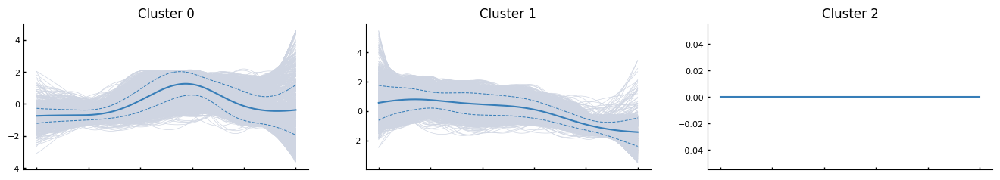

In [291]:
palantir.plot.plot_gene_trend_clusters(atlas, "Erythroid")
plt.show()

In [292]:
atlas

AnnData object with n_obs × n_vars = 170950 × 27669
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'cell', 'sample', 'embryo_version', 'stage', 'somite_count', 'anatomy', 'S_score', 'G2M_score', 'phase', 'louvain', 'leiden', 'celltype_PijuanSala2019', 'celltype_extended_atlas', 'sizeFactor', 'palantir_pseudotime', 'palantir_entropy'
    var: 'id', 'mgi_symbol', 'symbol', 'gene_trends_clusters'
    uns: 'celltype_extended_atlas_colors', 'DM_EigenValues', 'palantir_waypoints', 'palantir_fates_colors'
    obsm: 'X_PCA', 'X_UMAP', 'X_umap', 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'palantir_fate_probabilities', 'branch_masks'
    varm: 'gene_trends_Allantois', 'gene_trends_YS Endothelium', 'gene_trends_Erythroid', 'gene_trends_MkP', 'gene_trends_Mesenchyme', 'gene_trends_Cardiomyocytes', 'gene_trends_Limb Mesoderm', 'gene_trends_YS Mesothelium', 'gene_trends_LP Mesoderm', 'gene_trends_EMP', 'gene_trends_Endocardium', 'gene_trends_Epicardium'
    laye

/home/ridvan/venv-jlab/lib/python3.11/site-packages/anndata/_core/anndata.py:381: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


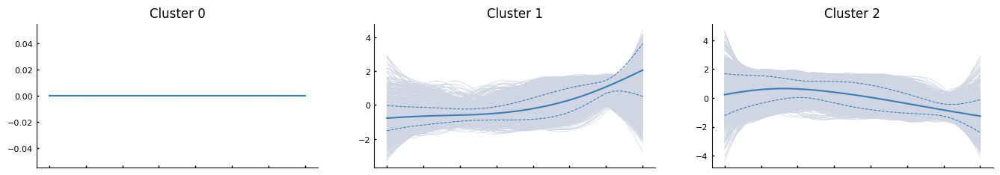

In [294]:
communities = palantir.presults.cluster_gene_trends(atlas, "EMP", more_genes)
palantir.plot.plot_gene_trend_clusters(atlas, "EMP")
plt.show()

/home/ridvan/venv-jlab/lib/python3.11/site-packages/anndata/_core/anndata.py:381: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


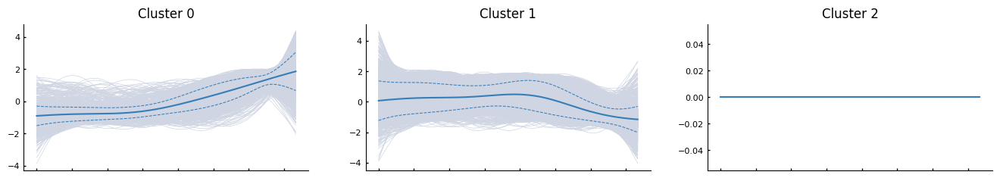

In [295]:
communities = palantir.presults.cluster_gene_trends(atlas, "YS Endothelium", more_genes)
palantir.plot.plot_gene_trend_clusters(atlas, "YS Endothelium")
plt.show()

# Save

In [296]:
# write to an uncompressed .h5ad
atlas.write_h5ad("atlas.h5ad")